In [1]:
import pandas as pd
import networkx as nx
import pickle as pk
import numpy as np
from gseapy.plot import barplot, dotplot

In [2]:
#These functions are useful for making some nice biological enrichments

def enr_df_dict(gene_list):   #This function returns the enrichment df for GOBP,GOCC,GOMF,KeGG
    
    import gseapy as gp
    
    libraries=['GO_Biological_Process_2021']
    try:
        geneset_to_enrich_GOBP_df = gp.enrichr(gene_list=gene_list,
                             gene_sets=libraries,
                             organism='human', # don't forget to set organism to the one you desired! e.g. Yeast
                             outdir=None, # don't write to disk
                            )
    except:
        pass

    libraries=['GO_Molecular_Function_2021']

    try:
        geneset_to_enrich_GOMF_df = gp.enrichr(gene_list=gene_list,
                             gene_sets=libraries,
                             organism='human', # don't forget to set organism to the one you desired! e.g. Yeast
                             outdir=None, # don't write to disk
                            )
    except:
        pass


    libraries=['GO_Cellular_Component_2021']
    try:
        geneset_to_enrich_GOCC_df = gp.enrichr(gene_list=gene_list,
                         gene_sets=libraries,
                         organism='human', # don't forget to set organism to the one you desired! e.g. Yeast
                         outdir=None, # don't write to disk
                        )
    except:
        pass


    libraries=['KEGG_2021_Human']
    try: 
        geneset_to_enrich_KEGG_df = gp.enrichr(gene_list=gene_list,
                         gene_sets=libraries,
                         organism='human', # don't forget to set organism to the one you desired! e.g. Yeast
                         outdir=None, # don't write to disk
                        )
    except:
        pass

    enrdf_dict={}
    enrdf_dict['KEGG']=geneset_to_enrich_KEGG_df
    enrdf_dict['GOBP']=geneset_to_enrich_GOBP_df
    enrdf_dict['GOMF']=geneset_to_enrich_GOMF_df
    enrdf_dict['GOCC']=geneset_to_enrich_GOCC_df
    return enrdf_dict

def enr_fdr_list(enr_df_dict):
    sig_dict={}
    for lib, enr_df in enr_df_dict.items():
        lib_significant_terms=[]
        for i,v in enr_df.res2d.iterrows():
            if v['Adjusted P-value']<0.05:
                lib_significant_terms.append(v['Term'])
        sig_dict[lib]=lib_significant_terms
    return sig_dict



### Pigs

In [3]:
#Let's read the dataset
pig_df=pd.read_excel("input/liver_offspring_significant_proteins_BS.xlsx", sheet_name="DAPs Liver offspring")


In [4]:
#Let's define the up- and down-regulated abundant proteins in the experiment
upregulated_degs=[]
downregulated_degs=[]

for i,v in pig_df.iterrows():
    if v['diff_abundant']=='Increased_in_HG':
        upregulated_degs.append(v['Genes'])
    else:
        downregulated_degs.append(v['Genes'])

In [5]:
#Let's download and import the pig STRING network
#STRING
#https://string-db.org/cgi/download?sessionId=bdb3FohRvEcb&species_text=Sus+scrofa

In [6]:
Pig_string_full_dict={}
with open("9823.protein.links.v11.5.txt") as f:
    next(f)
    for line in f:
        Pig_string_full_dict[line.split(" ")[0][5:],line.split(" ")[1][5:]]=float(line.split(" ")[2].strip())


In [7]:
#Let's convert the string ids to protein names
string_id_symbol_converter={}

with open("9823.protein.info.v11.5.txt") as f:
    next(f)
    for line in f:
        string_id_symbol_converter[line.split("\t")[0][5:]]=line.split("\t")[1]


Pig_string_full_dict_symbol={}
for pp, c_score in Pig_string_full_dict.items():
    Pig_string_full_dict_symbol[string_id_symbol_converter[pp[0]],string_id_symbol_converter[pp[1]]]=c_score

In [8]:
#Let's create the Pig PPIs
G_pig_string_full=nx.Graph()       #Full STRING PPI Network
G_pig_string_full_hc=nx.Graph()    #Full STRING PPI Network with high quality

for pp, c_score in Pig_string_full_dict_symbol.items():
    G_pig_string_full.add_edge(pp[0],pp[1])
    
for pp, c_score in Pig_string_full_dict_symbol.items():
    if c_score>700:
        G_pig_string_full_hc.add_edge(pp[0],pp[1])

print(G_pig_string_full.number_of_nodes())
print(G_pig_string_full_hc.number_of_nodes())

21299
15360


In [9]:
#Let's see how many up-/down-regulated proteins are present in the full PPI
print(len(set(upregulated_degs)&G_pig_string_full.nodes())/len(set(upregulated_degs)))
print(len(set(downregulated_degs)&G_pig_string_full.nodes())/len(set(downregulated_degs)))

0.9333333333333333
0.8360655737704918


In [10]:
#Let's see how many up-/down-regulated proteins are present in the full PPI with high confidence
print(len(set(upregulated_degs)&G_pig_string_full_hc.nodes())/len(set(upregulated_degs)))
print(len(set(downregulated_degs)&G_pig_string_full_hc.nodes())/len(set(downregulated_degs)))

0.7833333333333333
0.7704918032786885


In [11]:
#Let's focus only on the physical interactions

Pig_string_physical_dict={}
with open("9823.protein.physical.links.v11.5.txt") as f:
    next(f)
    for line in f:
        Pig_string_physical_dict[line.split(" ")[0][5:],line.split(" ")[1][5:]]=float(line.split(" ")[2].strip())

Pig_string_physical_dict_symbol={}
for pp, c_score in Pig_string_physical_dict.items():
    Pig_string_physical_dict_symbol[string_id_symbol_converter[pp[0]],string_id_symbol_converter[pp[1]]]=c_score

In [12]:
#Let's create the Pig PPIs
G_pig_string_physical=nx.Graph()       #Physical Pig STRING PPI
G_pig_string_physical_hc=nx.Graph()    #Physical Pig STRING PPI with high confidence

for pp, c_score in Pig_string_physical_dict_symbol.items():
    G_pig_string_physical.add_edge(pp[0],pp[1])
    
for pp, c_score in Pig_string_physical_dict_symbol.items():
    if c_score>700:
        G_pig_string_physical_hc.add_edge(pp[0],pp[1])

print(G_pig_string_physical.number_of_nodes())
print(G_pig_string_physical_hc.number_of_nodes())

19217
8561


In [13]:
#Let's see how many up-/down-regulated proteins are present in the Physical Pig STRING PPI
print(len(set(upregulated_degs)&G_pig_string_physical_hc.nodes())/len(set(upregulated_degs)))
print(len(set(downregulated_degs)&G_pig_string_physical_hc.nodes())/len(set(downregulated_degs)))

0.38333333333333336
0.47540983606557374


In [14]:

#Let's see how many up-/down-regulated proteins are present in the Physical Pig STRING PPI with high confidence
print(len(set(upregulated_degs)&G_pig_string_physical.nodes())/len(set(upregulated_degs)))
print(len(set(downregulated_degs)&G_pig_string_physical.nodes())/len(set(downregulated_degs)))

0.9166666666666666
0.819672131147541


In [15]:
#Let's check for each network which groups of proteins form a module

tot_degs=set(upregulated_degs).union(downregulated_degs)

pig_networks_dict={}
pig_networks_dict["G_pig_string_full"]=G_pig_string_full
pig_networks_dict["G_pig_string_full_hc"]=G_pig_string_full_hc
pig_networks_dict["G_pig_string_physical"]=G_pig_string_physical
pig_networks_dict["G_pig_string_physical_hc"]=G_pig_string_physical_hc

deg_dict={}
deg_dict["upregulated_degs"]=upregulated_degs
deg_dict["downregulated_degs"]=downregulated_degs
deg_dict["tot_degs"]=tot_degs



In [41]:
import random as rd
import numpy as np
#Here, we calculate the modularity of the differentially abundant proteins in each condition for each Pig STRING network
pig_deg_modularity={}
for deg_name,deg_list in deg_dict.items():
    for net_name,network in pig_networks_dict.items():
        
        G_sub = nx.subgraph(network,deg_list)
        G_sub_lcc = G_sub.subgraph(max(nx.connected_components(G_sub), key=len))  # extract lcc graph
        f_lcc_size = G_sub_lcc.number_of_nodes()
        l_random_lccs = []

        S = 10000
        for s in range(S):
            gene_sample = rd.sample(network.nodes(),len(set(deg_list)))
            G_sub_rnd = nx.subgraph(network,gene_sample)
            G_sub_rnd_lcc = G_sub_rnd.subgraph(max(nx.connected_components(G_sub_rnd), key=len))  # extract lcc graph
            lcc_size = G_sub_rnd_lcc.number_of_nodes()
            l_random_lccs.append(lcc_size)
        mu = np.mean(l_random_lccs)
        std = np.std(l_random_lccs)

        z = (f_lcc_size-mu)/std
        
        pig_deg_modularity[deg_name,net_name]=[z,G_sub_lcc.nodes()]
        
        

/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pand

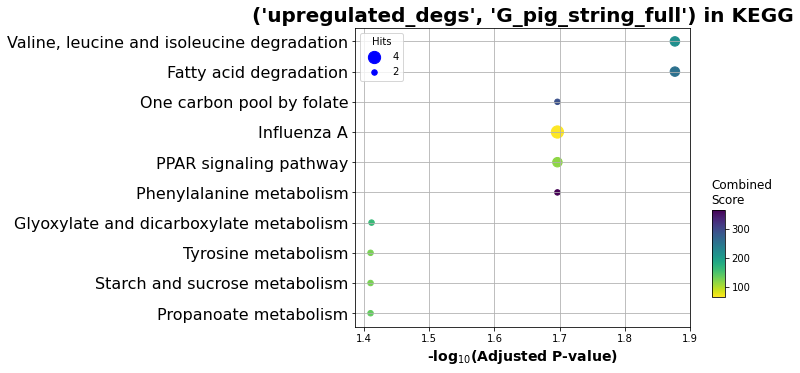

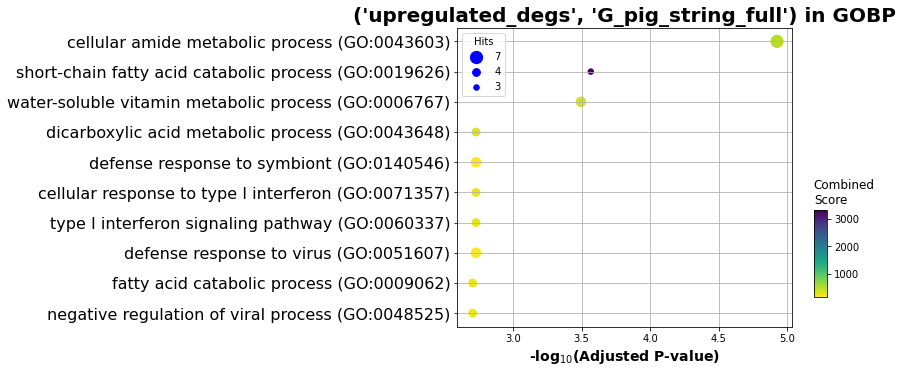

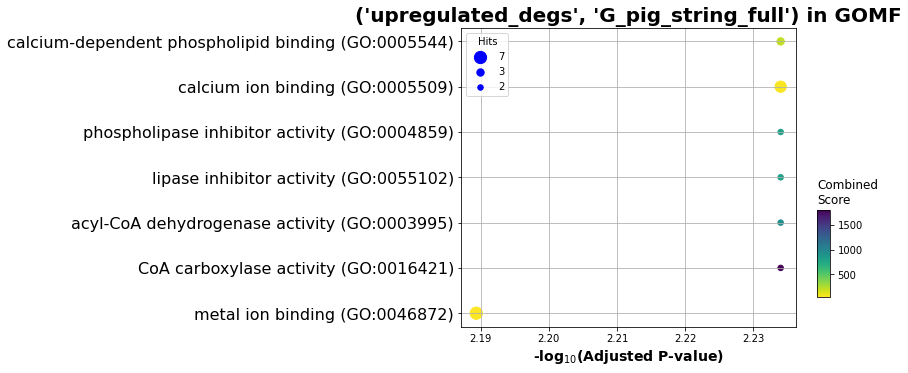

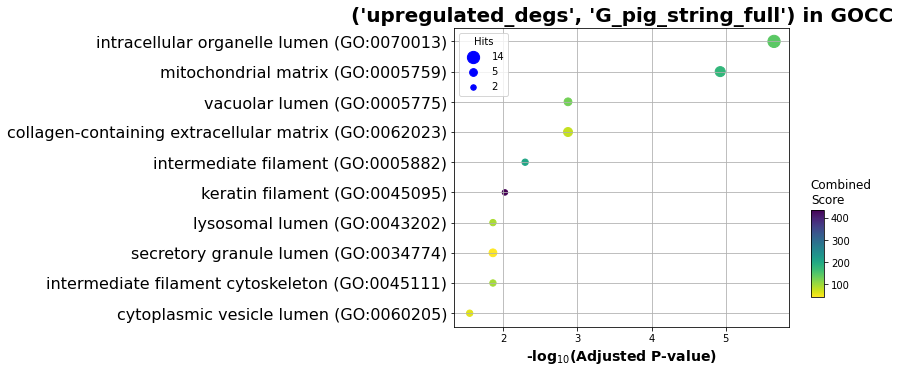

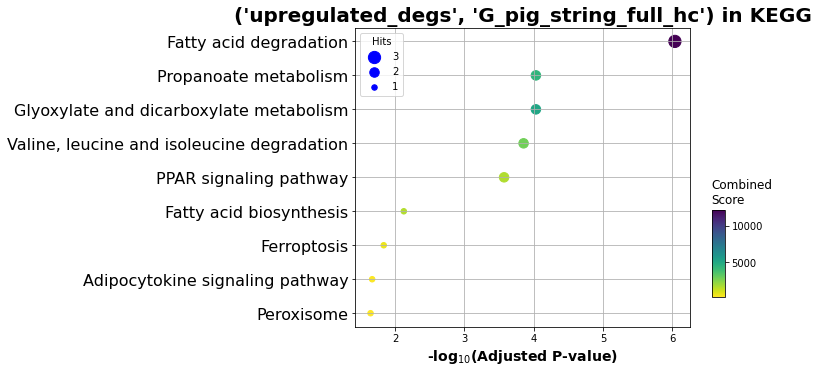

...

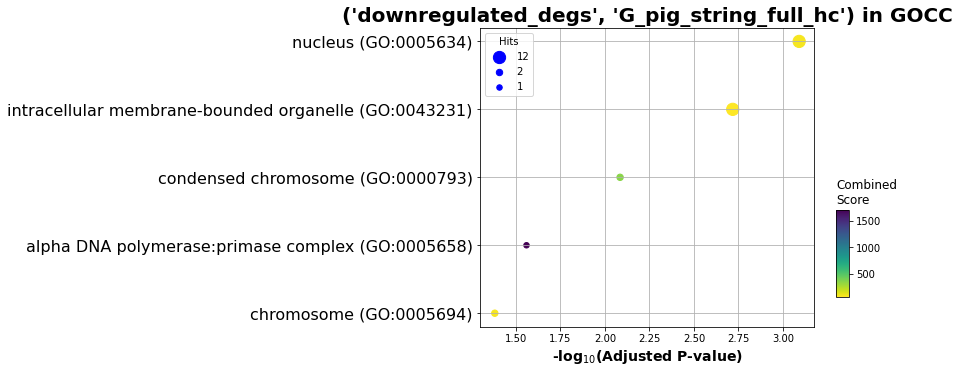

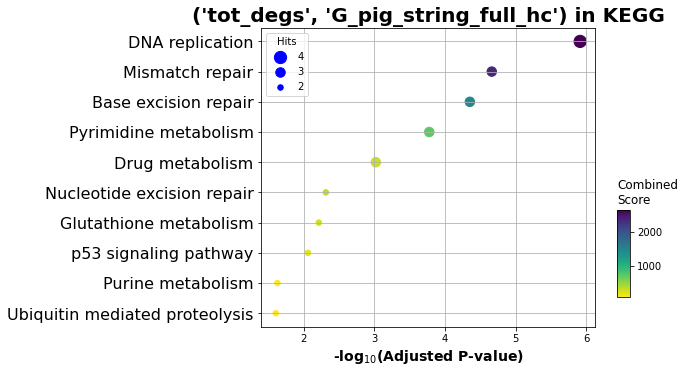

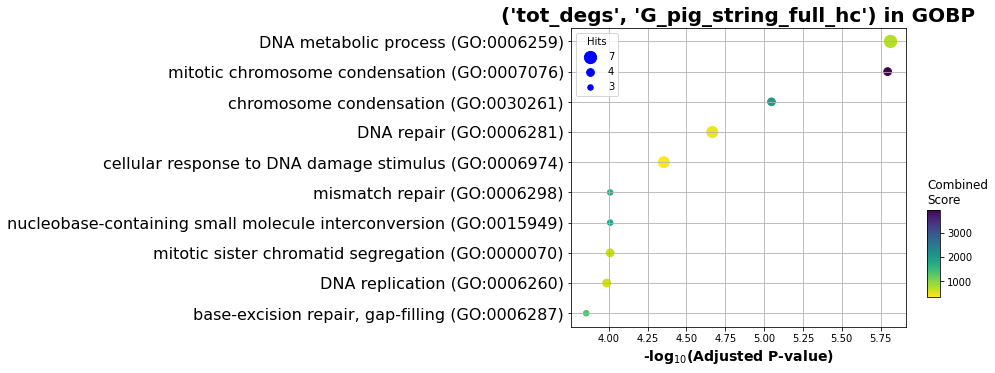

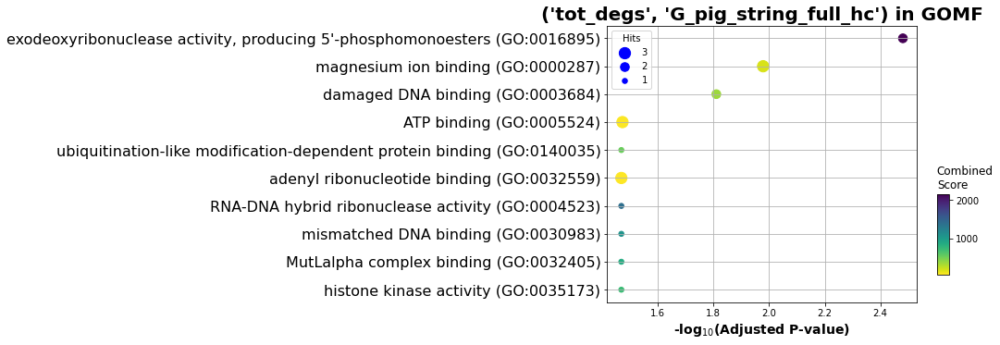

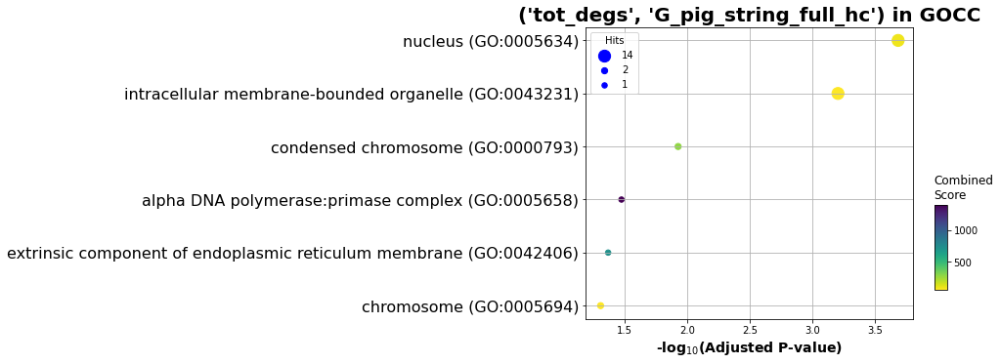

In [122]:
#For now, let's perform an enrichment analysis of this connected core in each network (let's take only those that
#have a z-core higher than 2)

from gseapy.plot import barplot, dotplot
deg_modularity_core_enrichment_df_dict={}
deg_modularity_core_enrichment_fdr_dict={}
for deg_net,z_list in pig_deg_modularity.items():
    if z_list[0]>2:
        genelist=list(z_list[1])
        deg_modularity_core_enrichment_df_dict[deg_net]=enr_df_dict(genelist)
        
for deg_net,enr_df_dict in deg_modularity_core_enrichment_df_dict.items():
    deg_modularity_core_enrichment_fdr_dict[deg_net]=enr_fdr_list(enr_df_dict)
    for lib_term,enr_df in enr_df_dict.items():
        dotplot(enr_df.res2d, title='%s in %s'%(deg_net,lib_term),cmap='viridis_r')
            

In [123]:
#Let's make a random walk, so that we can contain all the 
from sklearn.preprocessing import normalize
def rnd_walk_matrix(A, r, a, num_nodes):
    num = 1*num_nodes
    n = num_nodes
    factor = float((1-a)/n)
    E = np.multiply(factor,np.ones([n,n])) 
    A_tele = np.multiply(a,A) + E  
    M = normalize(A_tele, norm='l1', axis=0)                                 # column wise normalized MArkov matrix
    del A
    del A_tele
    del E
    U = np.identity(n,dtype=int) 
    H = (1-r)*M
    H1 = np.subtract(U,H)
    del U
    del M
    del H    
    W = r*np.linalg.inv(H1)   
    return W


# RANDOM WALK PARAMETERS
r = .9
alpha = 1.

#Let's expand each condition for each Pig STRING network
pig_networks_expanded_modules_dict={}

for net_name,network in pig_networks_dict.items():
    num_nodes = network.number_of_nodes()                                         
    A = nx.adjacency_matrix(network)                                
    W = rnd_walk_matrix(A, r, alpha, num_nodes)                             
    d_idx_sym = {}                                                              
    cc = 0                                                                      
    for sym in network.nodes():                                              
        d_idx_sym[cc] = sym                                                   
        cc += 1                                                                 
    d_sym_idx = dict((y,x) for x,y in d_idx_sym.items()) 

    pig_degs_expanded_modules_dict={}
    for deg_name,deg_list in deg_dict.items():

        geneset=set(deg_list)&network.nodes()
        nodeset = []
        for s_ent in geneset:
            nodeset.append(d_sym_idx[s_ent])
        normprob = len(nodeset)
        p0 = np.zeros(network.number_of_nodes())
        # generate start vector
        for n in range(len(p0)):
            if n in nodeset:
                p0[n] = 1.
        pinf =  np.array(W.dot(p0))
        # DICT WITH NODE ID AND PVIS 
        d_n_p = {}
        i = 0
        for x in pinf:
        #     print(i,x)
            d_n_p[d_idx_sym[i]] = x/normprob
            i += 1  
        pcum = 0
        l_rndwnodes = []
        cc = 0
        for node, pvis in sorted(d_n_p.items(), key = lambda x: x[1], reverse = True):
            pcum += pvis
            l_rndwnodes.append(node)
            G_deg_condition = network.subgraph(l_rndwnodes)  
            if nx.is_connected(G_deg_condition) and cc>len(nodeset):
                break
            cc += 1

        pig_degs_expanded_modules_dict[deg_name]=G_deg_condition

    pig_networks_expanded_modules_dict[net_name]=pig_degs_expanded_modules_dict





<ipython-input-123-f5f4fd4534b2>:31: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  A = nx.adjacency_matrix(network)
<ipython-input-123-f5f4fd4534b2>:31: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  A = nx.adjacency_matrix(network)
<ipython-input-123-f5f4fd4534b2>:31: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  A = nx.adjacency_matrix(network)
<ipython-input-123-f5f4fd4534b2>:31: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  A = nx.adjacency_matrix(network)


/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pand

/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pand

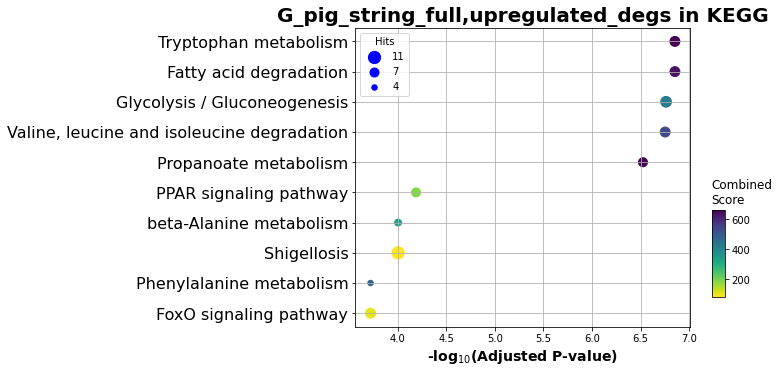

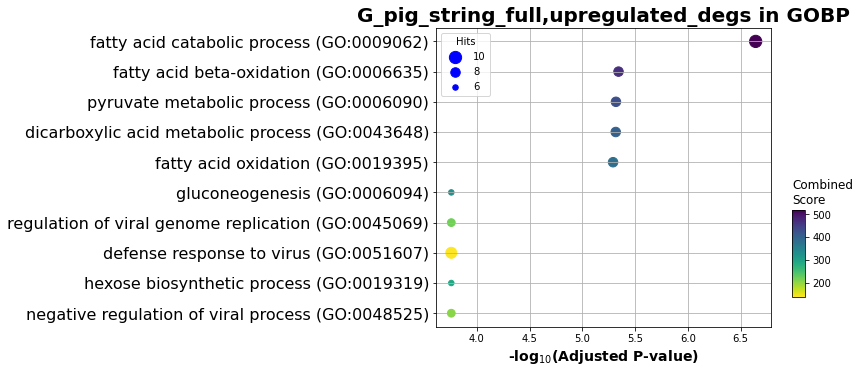

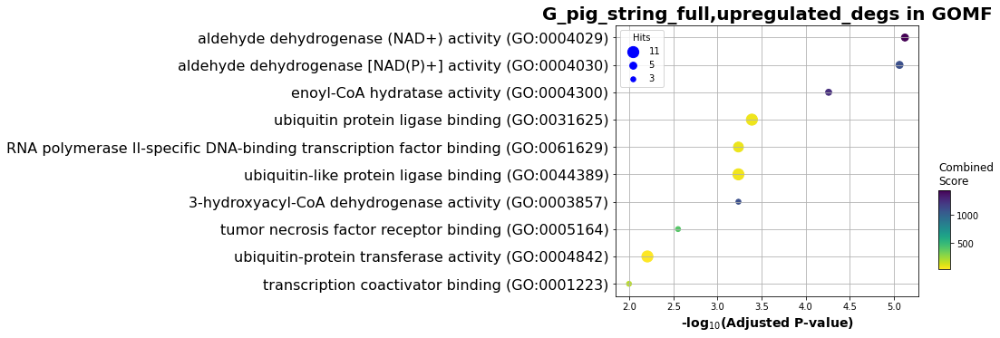

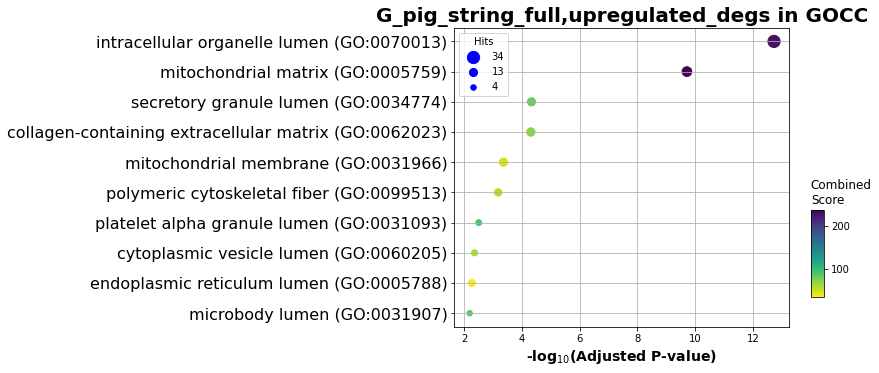

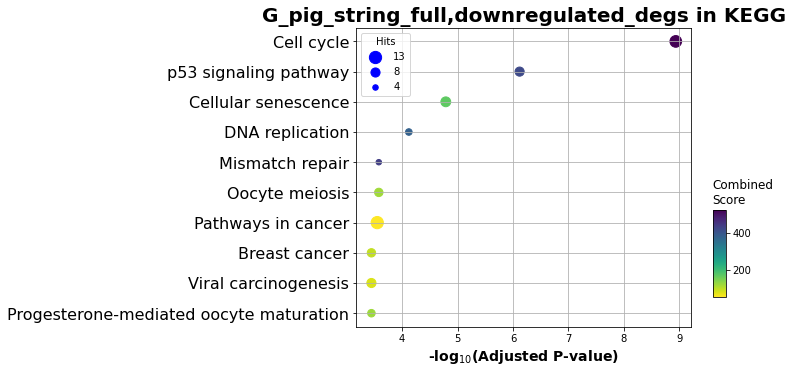

...

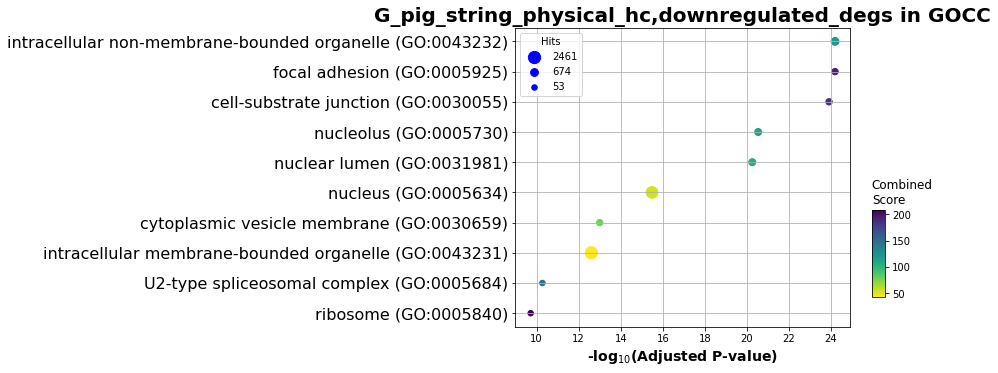

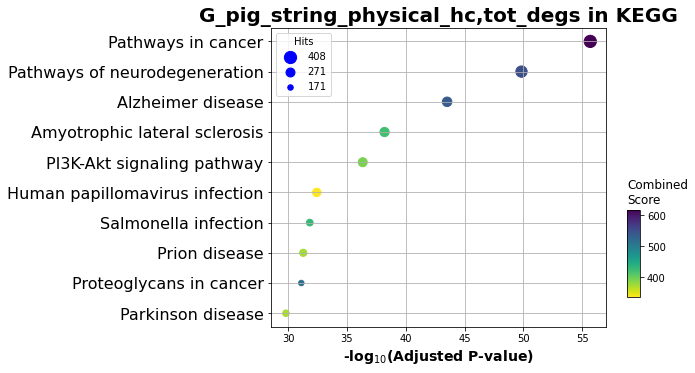

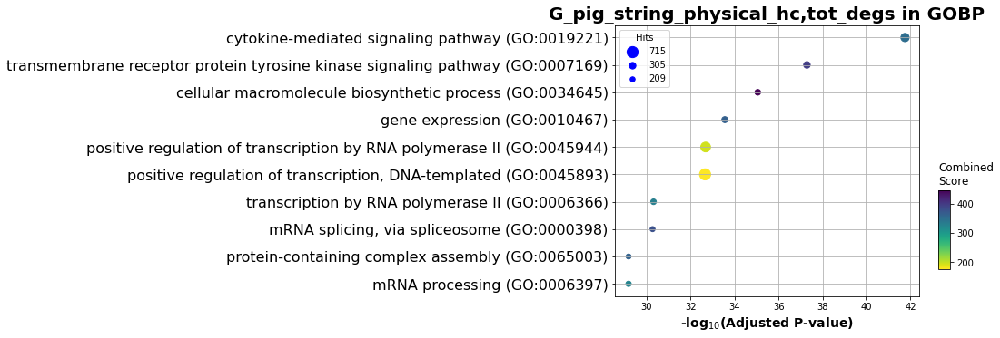

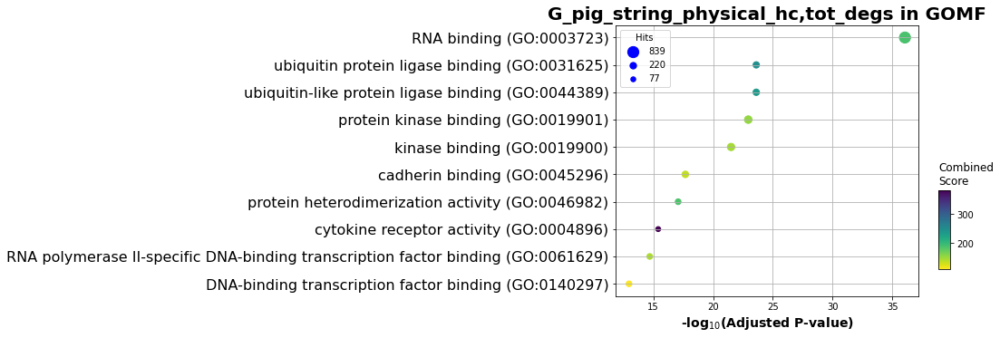

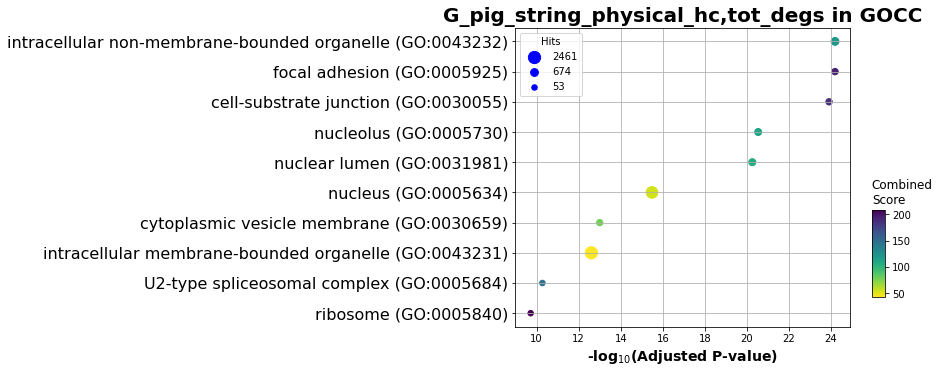

In [137]:
#Here, we calculate the biological enrichment of each expanded condition for each Pig STRING PPI network
pig_networks_expanded_modules_enrichment_df_dict={}
pig_networks_expanded_modules_enrichment_fdr_dict={}

for net_name,condition_dict in pig_networks_expanded_modules_dict.items():
    for cond_name,exp_net in condition_dict.items():
        genelist=list(exp_net.nodes())
        dict_key=net_name+','+cond_name
        pig_networks_expanded_modules_enrichment_df_dict[dict_key]=enr_df_dict(genelist)
        
for net_deg,enr_df_dict in pig_networks_expanded_modules_enrichment_df_dict.items():
    pig_networks_expanded_modules_enrichment_fdr_dict[net_deg]=enr_fdr_list(enr_df_dict)
    for lib_term,enr_df in enr_df_dict.items():
        dotplot(enr_df.res2d, title='%s in %s'%(net_deg,lib_term),cmap='viridis_r')

In [223]:
#Let's save these results in the output folder
with open('output/pig_networks_expanded_modules_dict.pickle', 'wb') as handle:
    pk.dump(pig_networks_expanded_modules_dict, handle, protocol=pk.HIGHEST_PROTOCOL)

In [26]:
#Here we decided to check not just for the largest connected component, but also for all possible components
#basically, we will identify two distinct components among the upregulated genes
import random as rd
import numpy as np
pig_deg_modularity={}
for deg_name,deg_list in deg_dict.items():
    for net_name,network in pig_networks_dict.items():
        interesting_components_size_zscore={}
        G_sub = nx.subgraph(network,deg_list)
        G_sub_components = [G_sub.subgraph(c).copy() for c in nx.connected_components(G_sub)]
        interesting_components_size={}
        for c in G_sub_components:
            if len(c.nodes())>2:
                interesting_components_size[c]=c.number_of_nodes()
                
        l_random_lccs = []

        S = 10000
        for s in range(S):
            gene_sample = rd.sample(network.nodes(),len(set(deg_list)))
            G_sub_rnd = nx.subgraph(network,gene_sample)
            G_sub_rnd_lcc = G_sub_rnd.subgraph(max(nx.connected_components(G_sub_rnd), key=len))  # extract lcc graph
            lcc_size = G_sub_rnd_lcc.number_of_nodes()
            l_random_lccs.append(lcc_size)
            
        mu = np.mean(l_random_lccs)
        std = np.std(l_random_lccs)

        for i_c,i_c_size in interesting_components_size.items():

            z = (i_c_size-mu)/std
            c_key=','.join(list(i_c.nodes()))
            interesting_components_size_zscore[c_key]=z
        pig_deg_modularity[deg_name,net_name]=interesting_components_size_zscore
    

In [27]:
#Let's select only the significant modules
pig_deg_modularity_string_hc_significant={}
for deg_net,z_dict in pig_deg_modularity.items():
    if 'G_pig_string_full_hc'==deg_net[1]:
        sig_module_dict={}
        for module_list, z_score in z_dict.items():
            if z_score>2:
                sig_module_dict[module_list]=z_score
        pig_deg_modularity_string_hc_significant[deg_net[0]]=sig_module_dict
            

In [28]:
pig_deg_modularity_string_hc_significant

{'upregulated_degs': {'IFI44,IFIT5,MX2,ISG15,IFI44L': 3.0048699062917135,
  'ACADL,ACSL6,PCCB,PCCA,ACADVL': 3.0048699062917135},
 'downregulated_degs': {'SPC25,LIG1,FEN1,UBE2C,SMC4,PRIM2,DUT,NDC1,CDK1,NCAPG,SMC2,RRM1,POLD1,MSH6,RRM2,PBK,KPNA2': 16.36208122976164},
 'tot_degs': {'SPC25,FEN1,NDC1,POLD1,UBE2C,PRIM2,SMC2,PBK,SP110,LIG1,LOC100517129,SMC4,DUT,RRM1,MSH6,KPNA2,CDK1,NCAPG,PML,RRM2': 8.62251783736872}}

In [16]:
pig_core_modules={}
pig_core_modules['upregulated_degs_1']=['ACADVL','ACADL','ACSL6','PCCA','PCCB']
pig_core_modules['upregulated_degs_2']=['IFI44L','ISG15','IFI44','MX2','IFIT5']
pig_core_modules['downregulated_degs']=['SMC2','FEN1','NCAPG','LIG1','DUT','PBK','CDK1','UBE2C','KPNA2','NDC1','SMC4','POLD1','RRM2','MSH6','SPC25','PRIM2','RRM1']
pig_core_modules['tot_degs']=['FEN1','PML','NCAPG','LIG1','LOC100517129','SP110','SMC4','MSH6','CDK1','UBE2C','KPNA2','NDC1','RRM2','PRIM2','SMC2','SPC25','DUT','RRM1','PBK','POLD1']





/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pand

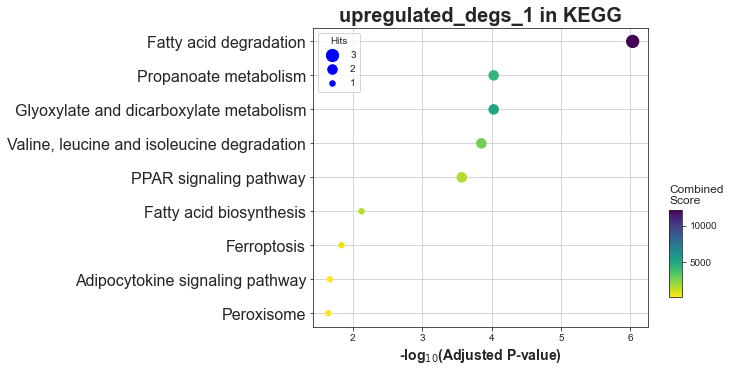

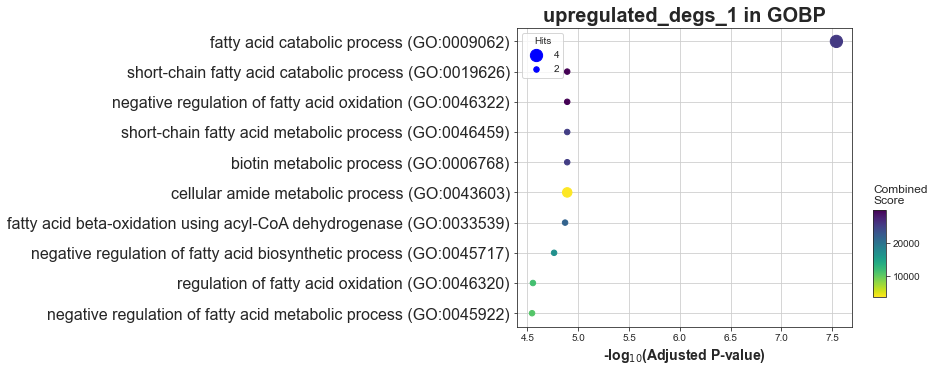

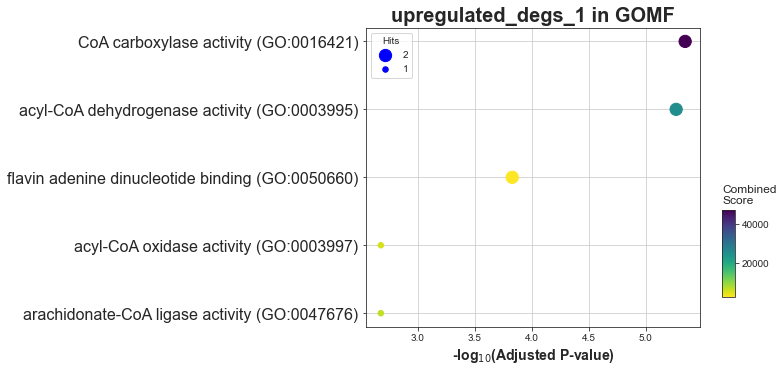

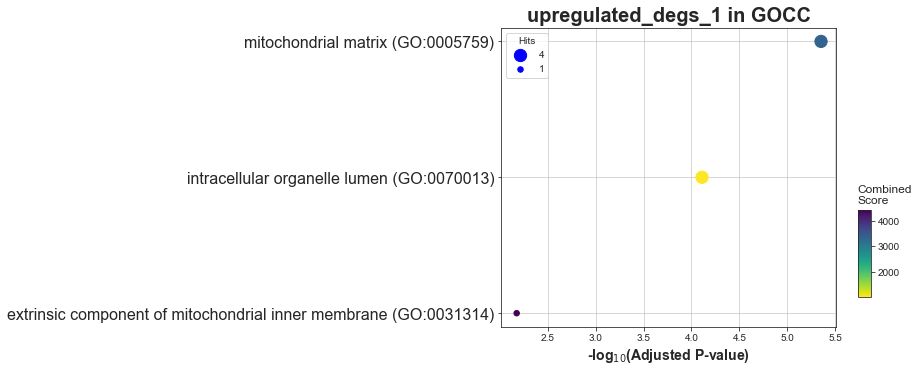

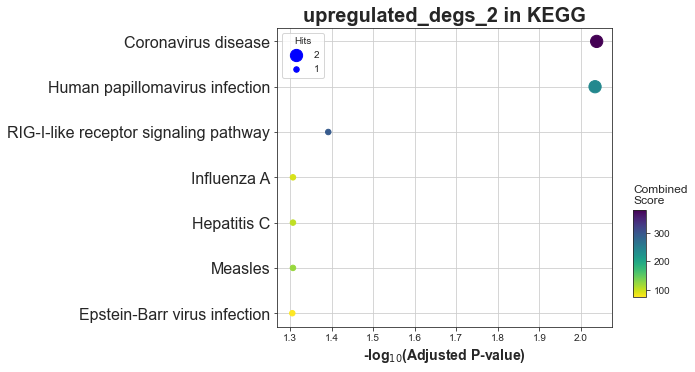

...

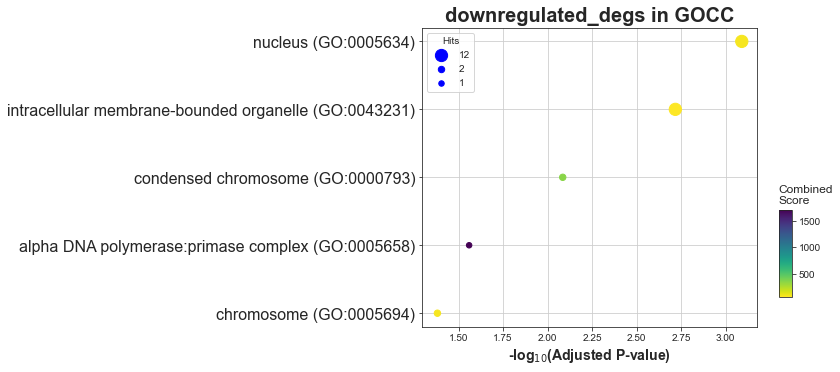

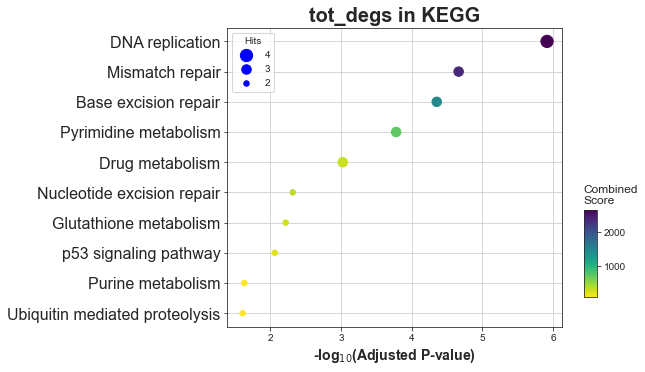

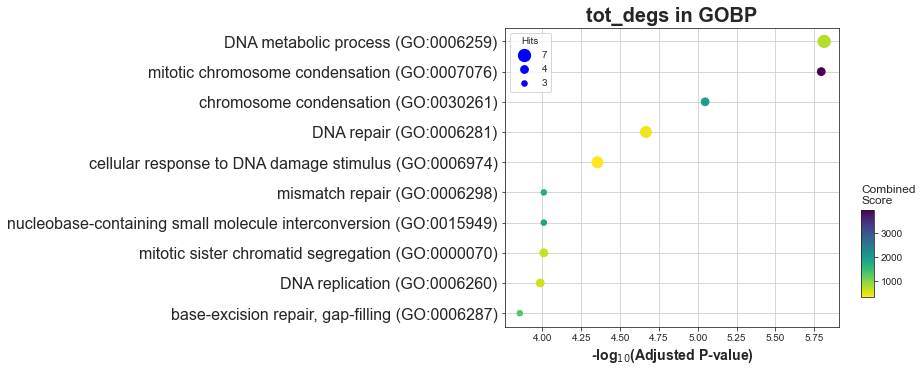

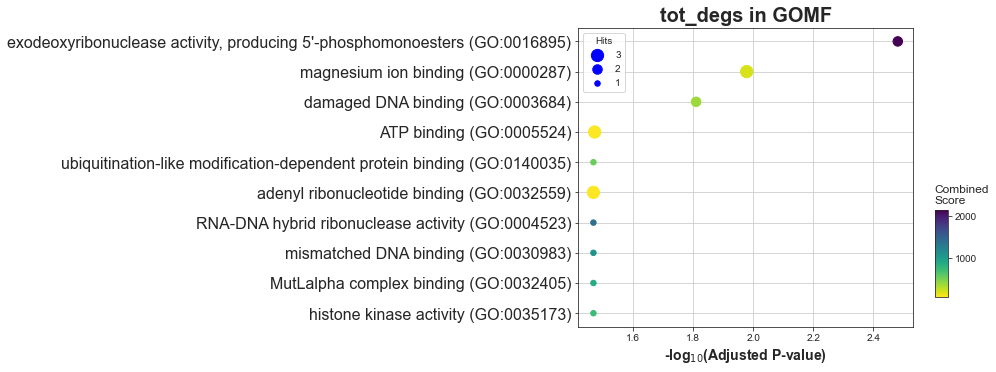

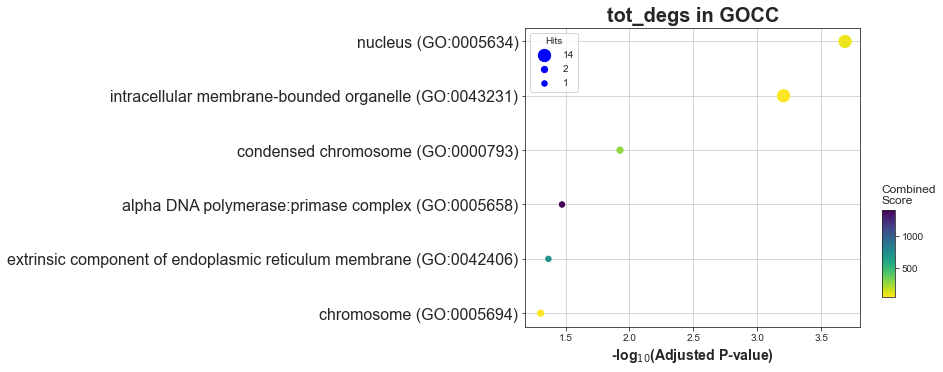

In [193]:
#Let's make some enrichment
from gseapy.plot import barplot, dotplot
pig_core_modules_df_dict={}
pig_core_modules_enrichment_fdr_dict={}
for condition,genelist in pig_core_modules.items():
    pig_core_modules_df_dict[condition]=enr_df_dict(genelist)
        
for condition,enrdf_dict in pig_core_modules_df_dict.items():
    pig_core_modules_enrichment_fdr_dict[condition]=enr_fdr_list(enrdf_dict)
    for lib_term,enr_df in enrdf_dict.items():
        dotplot(enr_df.res2d, title='%s in %s'%(condition,lib_term),cmap='viridis_r')

In [ ]:
libraries=['KEGG','GOBP','GOCC','GOMF']
pig_upregulated_degs_2_enrichment_terms=pd.DataFrame()
for lib in libraries:
    df_sel=pig_core_modules_df_dict['upregulated_degs_2'][lib].res2d[pig_core_modules_df_dict['upregulated_degs_2'][lib].res2d['Adjusted P-value']<0.05]
    pig_upregulated_degs_2_enrichment_terms=pig_upregulated_degs_2_enrichment_terms.append(df_sel)

In [ ]:
pig_upregulated_degs_2_enrichment_terms.to_csv("Tables/pig_upregulated_degs_2_enrichment_terms",index=False)

In [ ]:
libraries=['KEGG','GOBP','GOCC','GOMF']
pig_downcore_enrichment_terms=pd.DataFrame()
for lib in libraries:
    df_sel=pig_core_modules_df_dict['downregulated_degs'][lib].res2d[pig_core_modules_df_dict['downregulated_degs'][lib].res2d['Adjusted P-value']<0.05]
    pig_downcore_enrichment_terms=pig_downcore_enrichment_terms.append(df_sel)
    
pig_downcore_enrichment_terms.to_csv("Tables/pig_downcore_enrichment_terms",index=False)

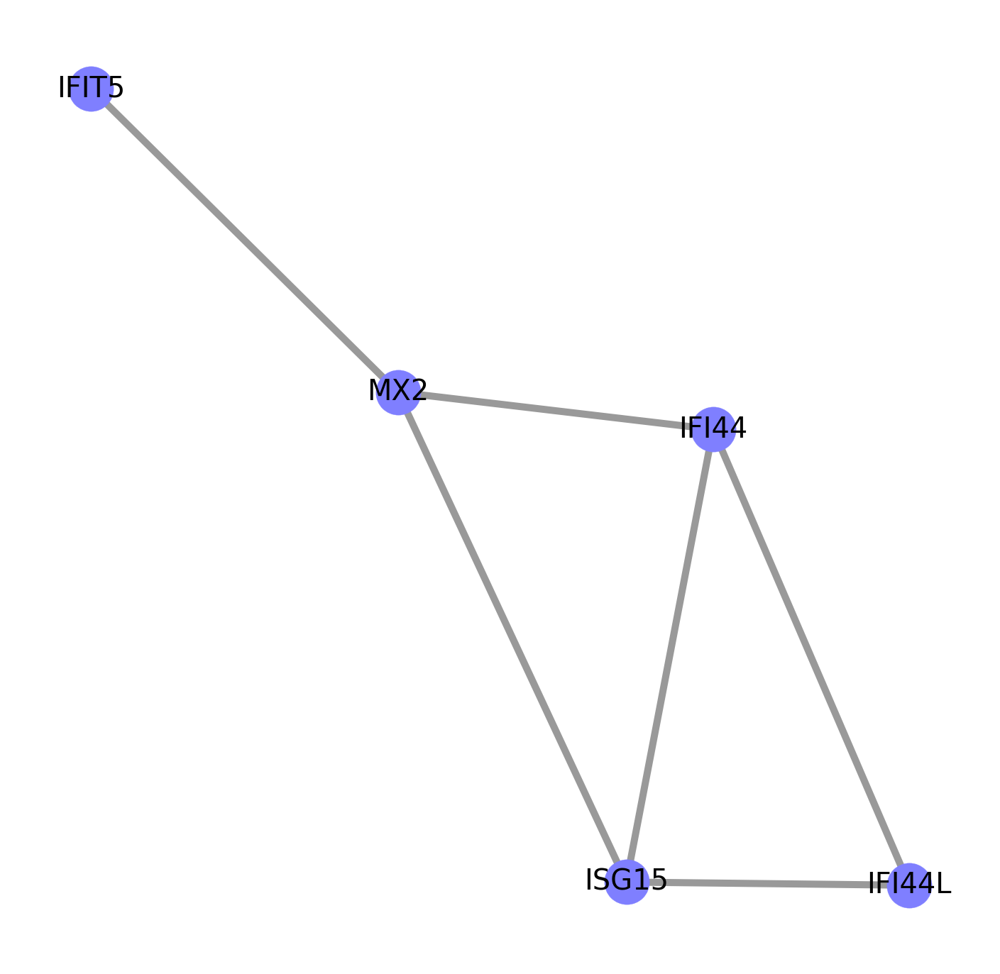

In [18]:
#Let's plot these core networks
import matplotlib.pyplot as plt
plt.figure(figsize=(25,25))
up_regulated_connected_genes=pig_core_modules['upregulated_degs_2']
G_pig_up_sub_network=nx.subgraph(G_pig_string_full_hc,up_regulated_connected_genes)
size=4000
# E D G E S 
opacity_nodes = 1
edge_color = 'grey'
edge_width = 10
opacity_edges = 0.8

#size = draw_node_size(backbone_ss_exposure_network_community_subnetwork, degs, node_factor) # node size based on degree
posG_spring = nx.spring_layout(G_pig_up_sub_network)
nx.draw_networkx_nodes(G_pig_up_sub_network, pos = posG_spring, linewidths = 0.5, node_color='#7F7FFF', node_size=size, node_shape='o', alpha = opacity_nodes)
nx.draw_networkx_edges(G_pig_up_sub_network, pos = posG_spring, width = edge_width, edge_color = edge_color, alpha = opacity_edges)
nx.draw_networkx_labels(G_pig_up_sub_network,pos=posG_spring,font_size=40)
plt.box(False)
#plt.savefig('Figures/Pigupcore2.png',transparent=True)
plt.show() 



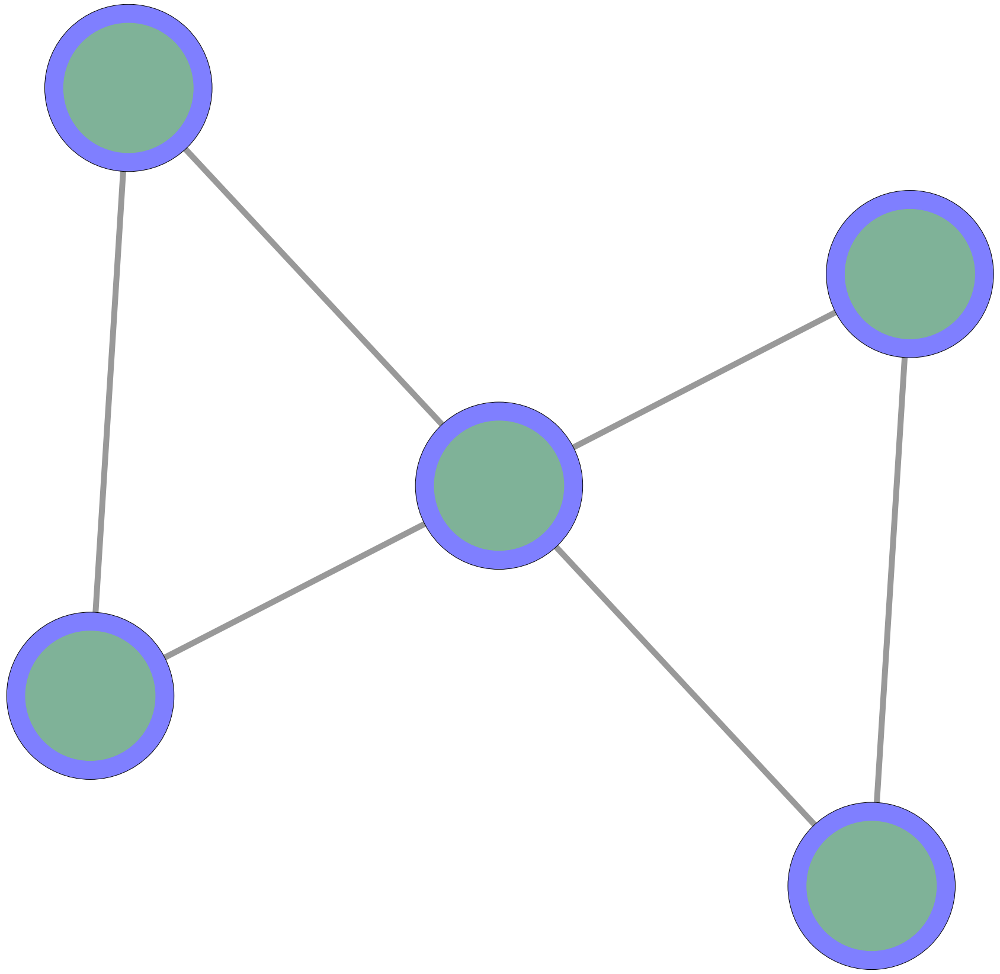

In [157]:
#Let's plot these core networks
import matplotlib.pyplot as plt
plt.figure(figsize=(30,30))
up_regulated_connected_genes=list(pig_deg_modularity_string_hc_significant['upregulated_degs'].keys())[1].split(',')
G_pig_up_sub_network=nx.subgraph(G_pig_string_full_hc,up_regulated_connected_genes)

# E D G E S 
opacity_nodes = 1
edge_color = 'grey'
edge_width = 10
opacity_edges = 0.8

scalef = 200
x = 20
#ring_frac = np.sqrt((x-1.)/x)
ring_frac = (x-8.)/x

posG_spring = nx.spring_layout(G_pig_up_sub_network)
l_x = []
l_y = []
l_size_outer = []
l_size_inner = []
color_inner = []
color_outer = []
for node in G_pig_up_sub_network.nodes():

    #k = nx.degree(G_ppi,node)
    k=100
    R = scalef*(1+k**1.3)
    r = ring_frac * R
    l_size_outer.append(R)
    l_size_inner.append(r)
    l_x.append(posG_spring[node][0])
    l_y.append(posG_spring[node][1])
    color_inner.append('#7FBF7F')
    color_outer.append('#7F7FFF')

        

plt.scatter(l_x,l_y,s=l_size_outer,c = color_outer,edgecolors='k',zorder=2)
plt.scatter(l_x,l_y,s=l_size_inner,c = color_inner,label = 'genes',zorder=2,alpha=.8)

#nx.draw_networkx_nodes(G_pig_up_sub_network, pos = posG_spring, linewidths = 0.5, node_color='red', node_size=size, node_shape='o', alpha = opacity_nodes)
nx.draw_networkx_edges(G_pig_up_sub_network, pos = posG_spring, width = edge_width, edge_color = edge_color, alpha = opacity_edges)
#nx.draw_networkx_labels(G_pig_up_sub_network,pos=posG_spring,font_size=40)
plt.box(False)
plt.savefig('Figures/Upcore1.png',transparent=True)
plt.show() 


### Human

In [19]:
#Let's import the human interactions from STING
Homo_string_full_dict={}
with open("9606.protein.links.v11.5.txt") as f:
    next(f)
    for line in f:
        Homo_string_full_dict[line.split(" ")[0][5:],line.split(" ")[1][5:]]=float(line.split(" ")[2].strip())


In [20]:
#Let's convert the STRING ids to protein ids
homo_string_id_symbol_converter={}

with open("9606.protein.info.v11.5.txt") as f:
    next(f)
    for line in f:
        homo_string_id_symbol_converter[line.split("\t")[0][5:]]=line.split("\t")[1]

Homo_string_full_dict_symbol={}
for pp, c_score in Homo_string_full_dict.items():
    Homo_string_full_dict_symbol[homo_string_id_symbol_converter[pp[0]],homo_string_id_symbol_converter[pp[1]]]=c_score
 

In [21]:
#Let's create the Human STRING PPI Networks
G_homo_string_full=nx.Graph()       #Full
G_homo_string_full_hc=nx.Graph()    #Full with high confidence

for pp, c_score in Homo_string_full_dict_symbol.items():
    G_homo_string_full.add_edge(pp[0],pp[1])
    
for pp, c_score in Homo_string_full_dict_symbol.items():
    if c_score>700:
        G_homo_string_full_hc.add_edge(pp[0],pp[1])

print(G_homo_string_full.number_of_nodes())
print(G_homo_string_full_hc.number_of_nodes())

19382
16793


In [22]:
#Let's see how many up-/down-regulated proteins are present in the full physical
print(len(set(upregulated_degs)&G_homo_string_full.nodes())/len(set(upregulated_degs)))
print(len(set(downregulated_degs)&G_homo_string_full.nodes())/len(set(downregulated_degs)))

0.9666666666666667
0.9344262295081968


In [23]:
#Let's see how many up-/down-regulated proteins are present in the full physical
print(len(set(upregulated_degs)&G_homo_string_full_hc.nodes())/len(set(upregulated_degs)))
print(len(set(downregulated_degs)&G_homo_string_full_hc.nodes())/len(set(downregulated_degs)))

0.95
0.9180327868852459


In [24]:
#Let's focus only on the physical interactions

Homo_string_physical_dict={}
with open("9606.protein.physical.links.v11.5.txt") as f:
    next(f)
    for line in f:
        Homo_string_physical_dict[line.split(" ")[0][5:],line.split(" ")[1][5:]]=float(line.split(" ")[2].strip())

Homo_string_physical_dict_symbol={}
for pp, c_score in Homo_string_physical_dict.items():
    Homo_string_physical_dict_symbol[homo_string_id_symbol_converter[pp[0]],homo_string_id_symbol_converter[pp[1]]]=c_score
    

In [25]:
#Let's create the Human STRING PPI Networks

G_homo_string_physical=nx.Graph()    #Physical PPI
G_homo_string_physical_hc=nx.Graph() #Physical PPI with high confidence

for pp, c_score in Homo_string_physical_dict_symbol.items():
    G_homo_string_physical.add_edge(pp[0],pp[1])
    
for pp, c_score in Homo_string_physical_dict_symbol.items():
    if c_score>700:
        G_homo_string_physical_hc.add_edge(pp[0],pp[1])

print(G_homo_string_physical.number_of_nodes())
print(G_homo_string_physical_hc.number_of_nodes())

18382
10196


In [26]:
#I think the physical and high content it is an acceptable number of proteins

#Let's see how many up-/down-regulated proteins are present 
print(len(set(upregulated_degs)&G_homo_string_physical_hc.nodes())/len(set(upregulated_degs)))
print(len(set(downregulated_degs)&G_homo_string_physical_hc.nodes())/len(set(downregulated_degs)))

0.55
0.6229508196721312


In [27]:

#Let's see how many up-/down-regulated proteins are present in the full physical
print(len(set(upregulated_degs)&G_homo_string_physical.nodes())/len(set(upregulated_degs)))
print(len(set(downregulated_degs)&G_homo_string_physical.nodes())/len(set(downregulated_degs)))

0.9666666666666667
0.9344262295081968


In [11]:
#Let's check for each network which groups of proteins form a module

homo_networks_dict={}
homo_networks_dict["G_homo_string_full"]=G_homo_string_full
homo_networks_dict["G_homo_string_full_hc"]=G_homo_string_full_hc
homo_networks_dict["G_homo_string_physical"]=G_homo_string_physical
homo_networks_dict["G_homo_string_physical_hc"]=G_homo_string_physical_hc




In [42]:
#Let's look at the modularity, but considering all seprated significant connected components (not just the largest)
import random as rd
import numpy as np
homo_deg_modularity={}
for deg_name,deg_list in deg_dict.items():
    for net_name,network in homo_networks_dict.items():
        interesting_components_size_zscore={}
        G_sub = nx.subgraph(network,deg_list)
        G_sub_components = [G_sub.subgraph(c).copy() for c in nx.connected_components(G_sub)]
        interesting_components_size={}
        for c in G_sub_components:
            if len(c.nodes())>2:
                interesting_components_size[c]=c.number_of_nodes()
                
        l_random_lccs = []

        S = 10000
        for s in range(S):
            gene_sample = rd.sample(network.nodes(),len(set(deg_list)))
            G_sub_rnd = nx.subgraph(network,gene_sample)
            G_sub_rnd_lcc = G_sub_rnd.subgraph(max(nx.connected_components(G_sub_rnd), key=len))  # extract lcc graph
            lcc_size = G_sub_rnd_lcc.number_of_nodes()
            l_random_lccs.append(lcc_size)
            
        mu = np.mean(l_random_lccs)
        std = np.std(l_random_lccs)

        for i_c,i_c_size in interesting_components_size.items():

            z = (i_c_size-mu)/std
            c_key=','.join(list(i_c.nodes()))
            interesting_components_size_zscore[c_key]=z
        homo_deg_modularity[deg_name,net_name]=interesting_components_size_zscore
        
        

In [52]:
#From these analyses of modularity, we suggest to use the full string hc
homo_deg_modularity

{('upregulated_degs',
  'G_homo_string_full'): {'ADAMTSL4,FHL1,PML,PCK1,ACADVL,TAT,PRELP,KRT8,IFI44,SP110,S100G,PLA2G4A,SULT1E1,PCCB,ACOT9,KRT18,GPNMB,GYG1,CHDH,CREG1,BCAT1,ASPN,PLEKHA4,RBP4,FAM111B,ANXA4,MYO6,IFIT5,SYNPO2,IFI44L,PDK2,ACADL,CASP1,FAM169A,ABCB4,DDC,HEBP2,ALDH1L2,BRD8,GPI,RNASEL,FBXO39,MTHFD1L,S100A6,KRT14,ISG15,ACSL6,ANXA5,CTSS,FBXO30,DHRS7,PCCA,AHSG,NNMT,ITM2B,MX2': 3.4156502553198664},
 ('upregulated_degs',
  'G_homo_string_full_hc'): {'ACADVL,ACADL,ACSL6,PCCA,PCCB': 2.711630722733202, 'IFI44L,ISG15,SP110,IFI44,MX2,RNASEL,IFIT5': 4.880935300919764},
 ('upregulated_degs',
  'G_homo_string_physical'): {'FHL1,MTHFD1L,PML,ACOT9,SYNPO2,GPI,PDK2,ISG15,PCCB,PLEKHA4,FBXO30,FAM111B,PCCA,MX2,MYO6,RNASEL,IFIT5': 5.834636230536863, 'ACADVL,ACADL,ACSL6': -1.6593919554737866},
 ('upregulated_degs', 'G_homo_string_physical_hc'): {},
 ('downregulated_degs',
  'G_homo_string_full'): {'FEN1,MAT2A,NCAPG,LIG1,SMC4,MSH6,PAQR7,CA14,PPP1R3B,METTL16,PDP2,ABCF2,NAV2,CDK1,UBE2C,KPNA2,SH3PXD2A,

In [60]:
#Let's select only the ones of the STRING FULL HC (>700) network
homo_deg_modularity_string_hc_significant={}
for deg_net,z_dict in homo_deg_modularity.items():
    if 'G_homo_string_full_hc'==deg_net[1]:
        sig_module_dict={}
        for module_list, z_score in z_dict.items():
            if z_score>2:
                sig_module_dict[module_list]=z_score
        homo_deg_modularity_string_hc_significant[deg_net[0]]=sig_module_dict

In [61]:
homo_deg_modularity_string_hc_significant

{'upregulated_degs': {'ACADVL,ACADL,ACSL6,PCCA,PCCB': 2.344001419559783,
  'IFI44L,ISG15,SP110,IFI44,MX2,RNASEL,IFIT5': 4.246136792082531},
 'downregulated_degs': {'FEN1,NCAPG,LIG1,SMC4,MSH6,ABCF2,CDK1,UBE2C,KPNA2,NDC1,RRM2,PRIM2,SMC2,MCM7,SPC24,KNTC1,SPC25,DUT,RRM1,PBK,POLD1,GEMIN7': 18.189125250429466},
 'tot_degs': {'FEN1,PML,NCAPG,LIG1,SMC4,MSH6,ABCF2,CDK1,UBE2C,KPNA2,NDC1,RRM2,PRIM2,SMC2,MCM7,SPC24,KNTC1,SPC25,DUT,RRM1,PBK,POLD1,GEMIN7': 7.0366005360022115}}

/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pand

/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pand

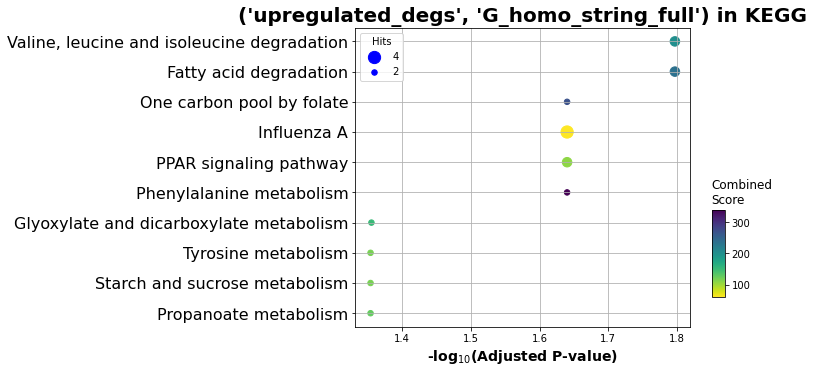

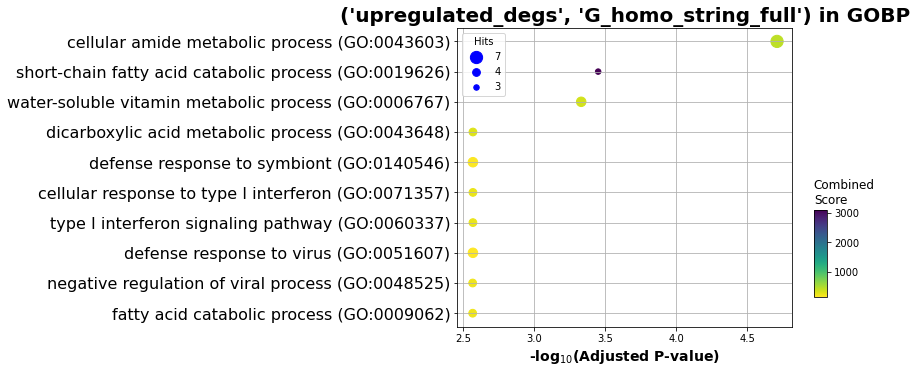

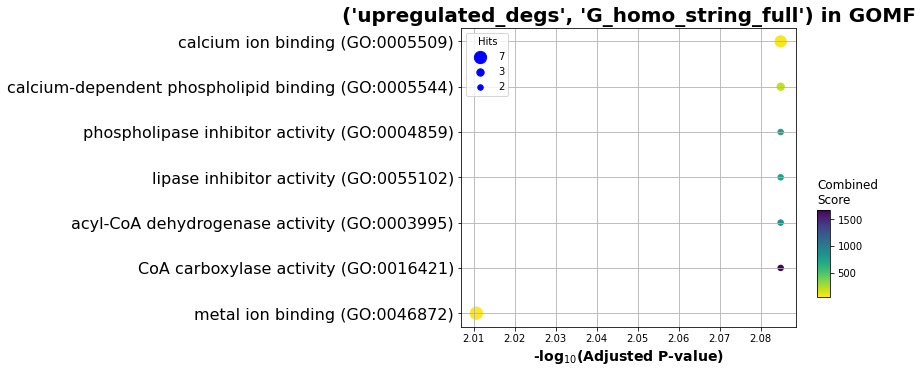

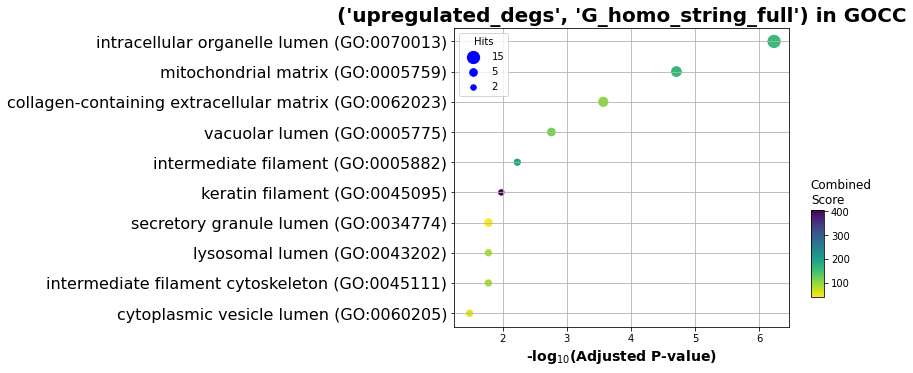

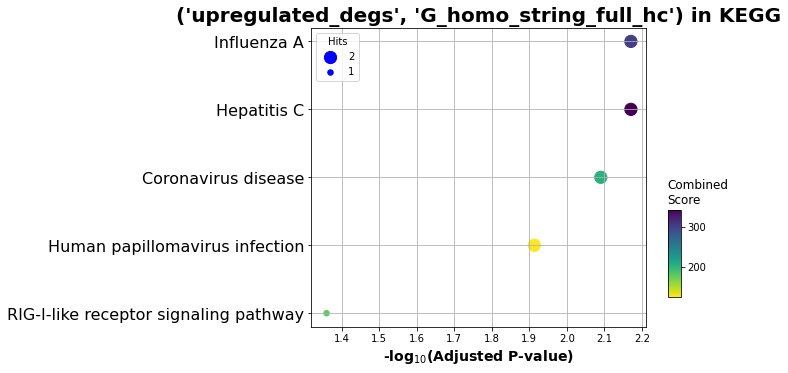

...

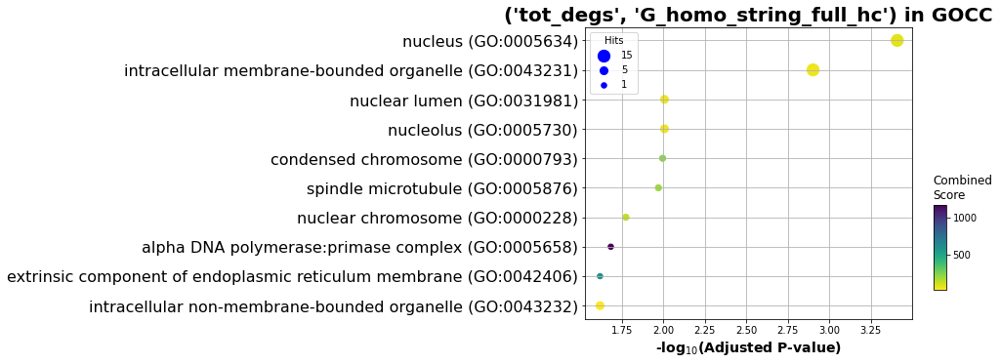

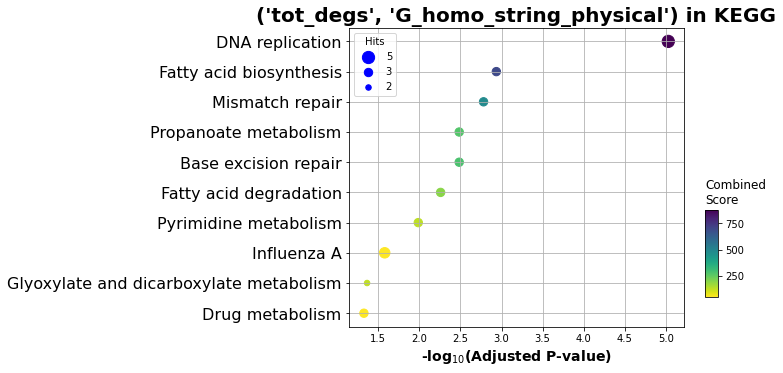

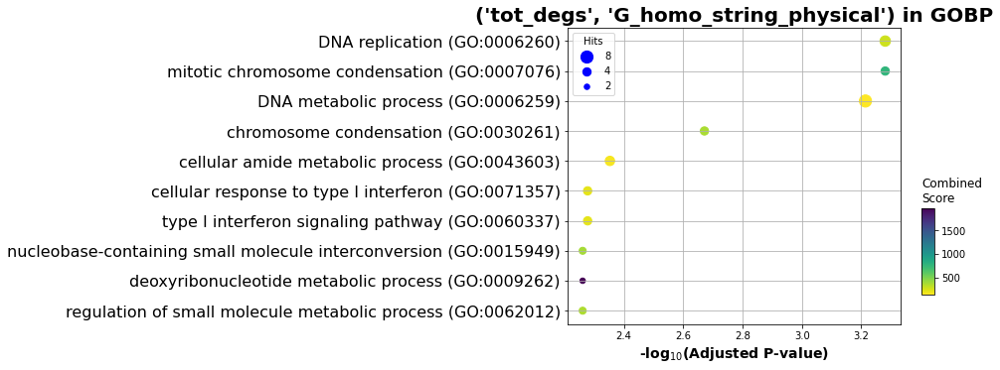

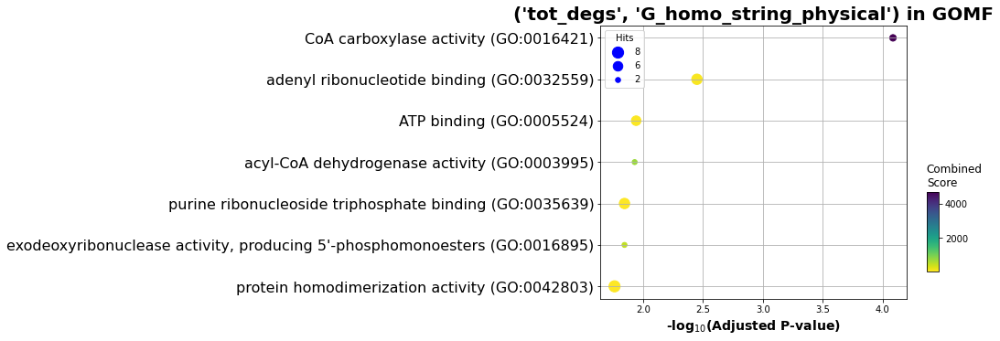

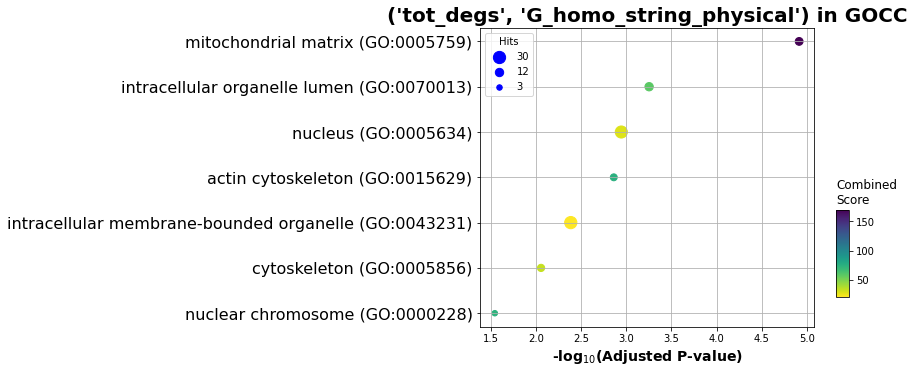

In [187]:
#For now, let's perform an enrichment analysis of this connected core in each network (let's take only those that
#have a z-core higher than 2)

from gseapy.plot import barplot, dotplot
homo_deg_modularity_core_enrichment_df_dict={}
homo_deg_modularity_core_enrichment_fdr_dict={}
for deg_net,z_list in homo_deg_modularity.items():
    if z_list[0]>2:
        genelist=list(z_list[1])
        homo_deg_modularity_core_enrichment_df_dict[deg_net]=enr_df_dict(genelist)
        
for deg_net,enr_df_dict in homo_deg_modularity_core_enrichment_df_dict.items():
    homo_deg_modularity_core_enrichment_fdr_dict[deg_net]=enr_fdr_list(enr_df_dict)
    for lib_term,enr_df in enr_df_dict.items():
        dotplot(enr_df.res2d, title='%s in %s'%(deg_net,lib_term),cmap='viridis_r')
            

In [188]:
#Let's make a random walk, so that we can contain all the 
from sklearn.preprocessing import normalize
def rnd_walk_matrix(A, r, a, num_nodes):
    num = 1*num_nodes
    n = num_nodes
    factor = float((1-a)/n)
    E = np.multiply(factor,np.ones([n,n])) 
    A_tele = np.multiply(a,A) + E  
    M = normalize(A_tele, norm='l1', axis=0)                                 # column wise normalized MArkov matrix
    del A
    del A_tele
    del E
    U = np.identity(n,dtype=int) 
    H = (1-r)*M
    H1 = np.subtract(U,H)
    del U
    del M
    del H    
    W = r*np.linalg.inv(H1)   
    return W


# RANDOM WALK PARAMETERS
r = .9
alpha = 1.

homo_networks_expanded_modules_dict={}

for net_name,network in homo_networks_dict.items():
    num_nodes = network.number_of_nodes()                                         
    A = nx.adjacency_matrix(network)                                
    W = rnd_walk_matrix(A, r, alpha, num_nodes)                             
    d_idx_sym = {}                                                              
    cc = 0                                                                      
    for sym in network.nodes():                                              
        d_idx_sym[cc] = sym                                                   
        cc += 1                                                                 
    d_sym_idx = dict((y,x) for x,y in d_idx_sym.items()) 

    homo_degs_expanded_modules_dict={}
    for deg_name,deg_list in deg_dict.items():

        geneset=set(deg_list)&network.nodes()
        nodeset = []
        for s_ent in geneset:
            nodeset.append(d_sym_idx[s_ent])
        normprob = len(nodeset)
        p0 = np.zeros(network.number_of_nodes())
        # generate start vector
        for n in range(len(p0)):
            if n in nodeset:
                p0[n] = 1.
        pinf =  np.array(W.dot(p0))
        # DICT WITH NODE ID AND PVIS 
        d_n_p = {}
        i = 0
        for x in pinf:
        #     print(i,x)
            d_n_p[d_idx_sym[i]] = x/normprob
            i += 1  
        pcum = 0
        l_rndwnodes = []
        cc = 0
        for node, pvis in sorted(d_n_p.items(), key = lambda x: x[1], reverse = True):
            pcum += pvis
            l_rndwnodes.append(node)
            G_deg_condition = network.subgraph(l_rndwnodes)  
            if nx.is_connected(G_deg_condition) and cc>len(nodeset):
                break
            cc += 1

        homo_degs_expanded_modules_dict[deg_name]=G_deg_condition

    homo_networks_expanded_modules_dict[net_name]=homo_degs_expanded_modules_dict





<ipython-input-188-7f714d3f9090>:31: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  A = nx.adjacency_matrix(network)
<ipython-input-188-7f714d3f9090>:31: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  A = nx.adjacency_matrix(network)
<ipython-input-188-7f714d3f9090>:31: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  A = nx.adjacency_matrix(network)
<ipython-input-188-7f714d3f9090>:31: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  A = nx.adjacency_matrix(network)


/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pand

/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
/Users/lsd/opt/anaconda3/lib/python3.8/site-packages/gseapy/enrichr.py:410: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pand

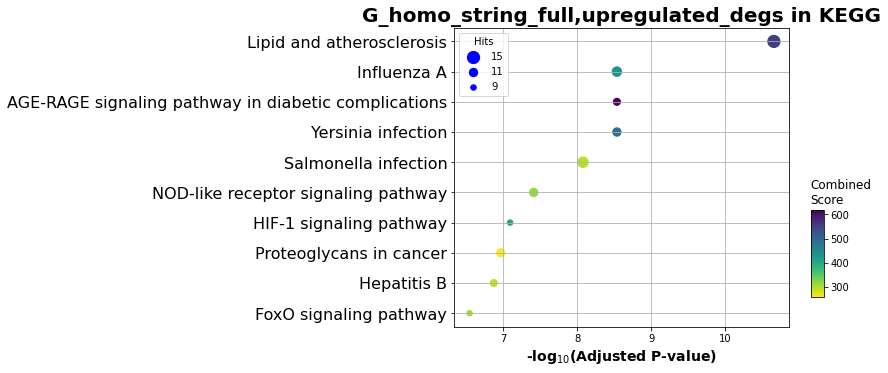

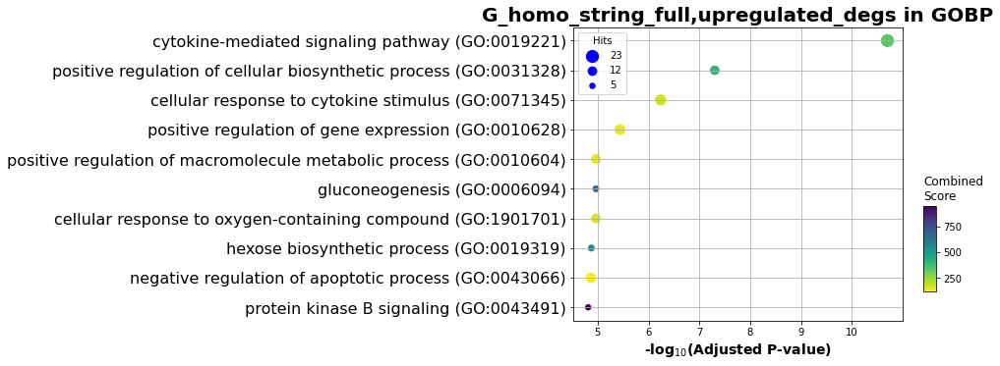

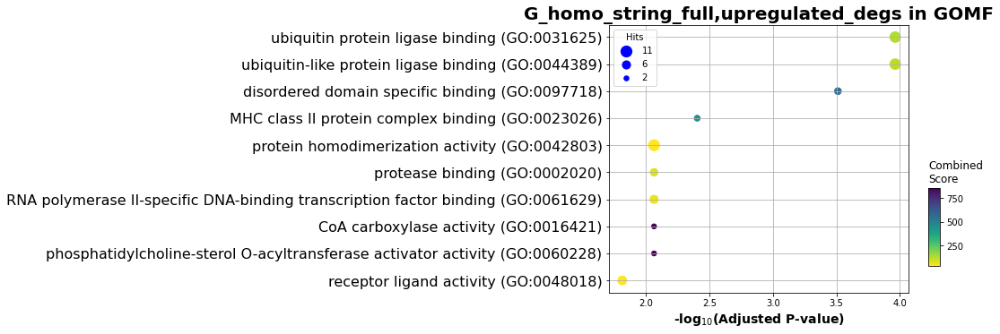

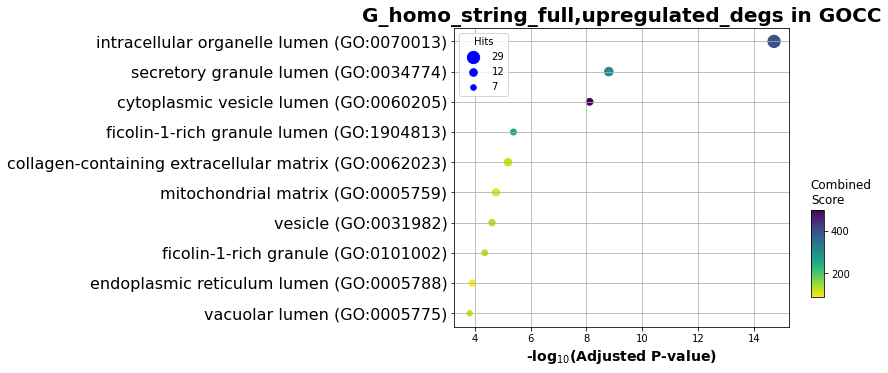

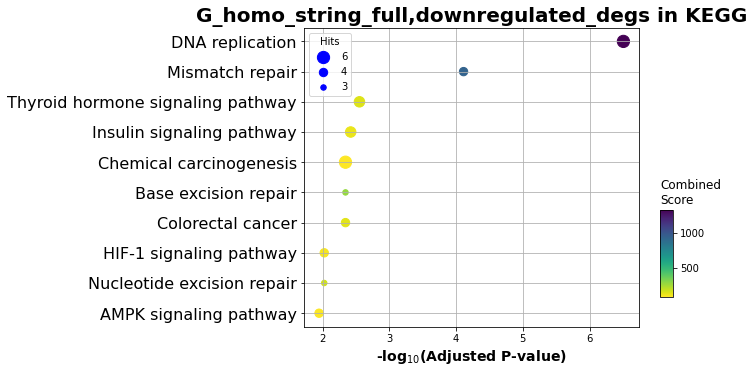

...

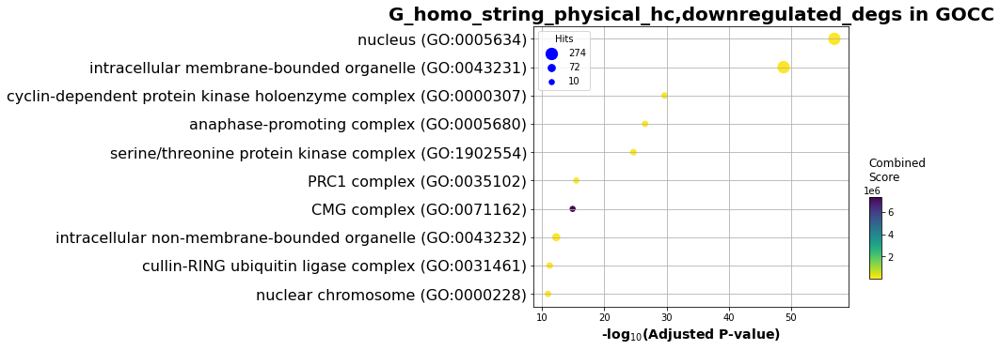

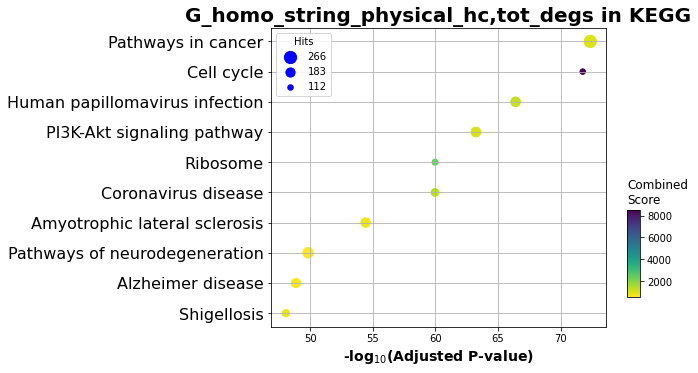

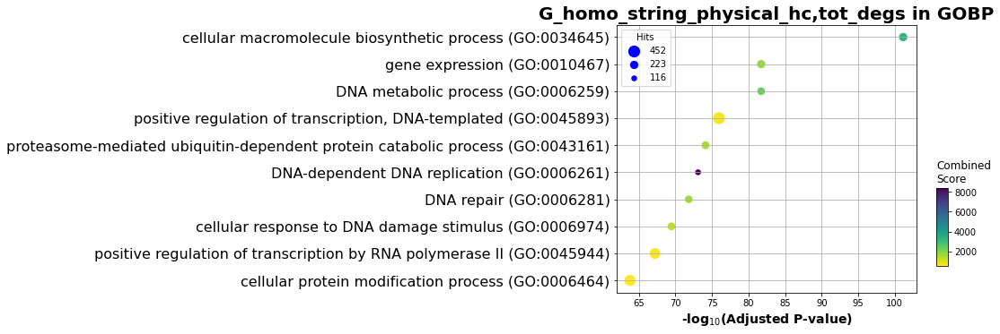

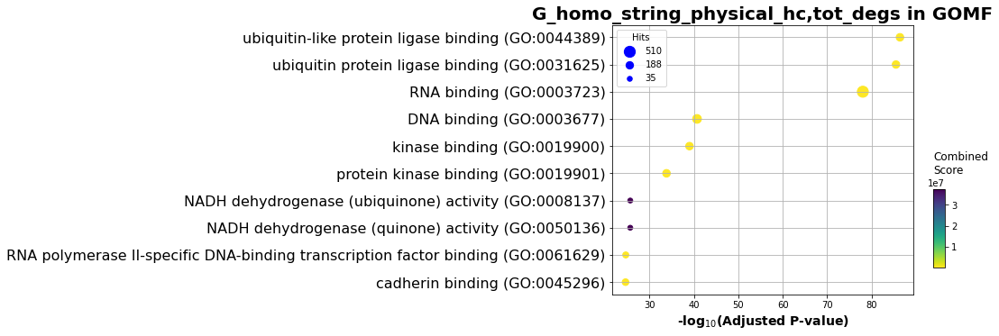

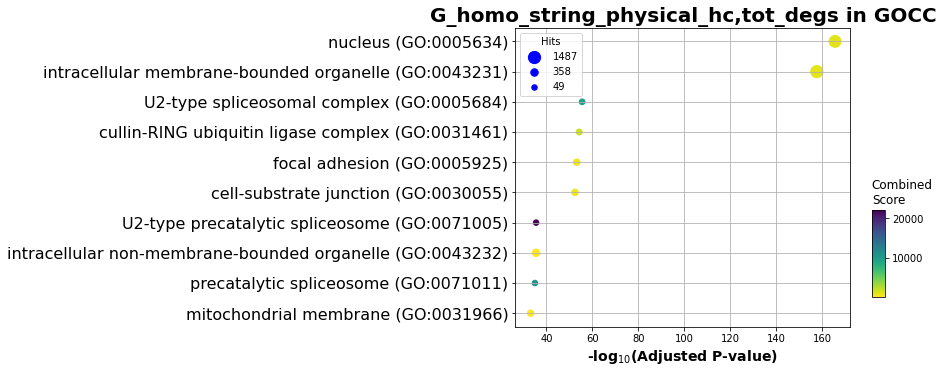

In [196]:
homo_networks_expanded_modules_enrichment_df_dict={}
homo_networks_expanded_modules_enrichment_fdr_dict={}

for net_name,condition_dict in homo_networks_expanded_modules_dict.items():
    for cond_name,exp_net in condition_dict.items():
        genelist=list(exp_net.nodes())
        dict_key=net_name+','+cond_name
        homo_networks_expanded_modules_enrichment_df_dict[dict_key]=enr_df_dict(genelist)
        
for net_deg,enrdf_dict in homo_networks_expanded_modules_enrichment_df_dict.items():
    homo_networks_expanded_modules_enrichment_fdr_dict[net_deg]=enr_fdr_list(enrdf_dict)
    for lib_term,enrdf in enrdf_dict.items():
        dotplot(enrdf.res2d, title='%s in %s'%(net_deg,lib_term),cmap='viridis_r')

In [28]:

homo_core_modules={}
homo_core_modules['upregulated_degs_1']=['ACADVL','ACADL','ACSL6','PCCA','PCCB']
homo_core_modules['upregulated_degs_2']=['IFI44L','ISG15','IFI44','MX2','IFIT5','SP110','RNASEL']
homo_core_modules['downregulated_degs']=[
    'FEN1','NCAPG','LIG1','SMC4','MSH6','ABCF2','CDK1','UBE2C','KPNA2','NDC1','RRM2','PRIM2','SMC2','MCM7','SPC24','KNTC1','SPC25','DUT','RRM1','PBK','POLD1','GEMIN7'
]
homo_core_modules['tot_degs']=[
    'FEN1','PML','NCAPG','LIG1','SMC4','MSH6','ABCF2','CDK1','UBE2C','KPNA2','NDC1','RRM2','PRIM2','SMC2','MCM7','SPC24','KNTC1','SPC25','DUT','RRM1','PBK','POLD1','GEMIN7'
]


In [ ]:
homo_core_modules_df_dict={}
homo_core_modules_enrichment_fdr_dict={}
for condition,genelist in homo_core_modules.items():
    homo_core_modules_df_dict[condition]=enr_df_dict(genelist)
        
for condition,enrdf_dict in homo_core_modules_df_dict.items():
    homo_core_modules_enrichment_fdr_dict[condition]=enr_fdr_list(enrdf_dict)
    for lib_term,enr_df in enrdf_dict.items():
        dotplot(enr_df.res2d, title='%s in %s'%(condition,lib_term),cmap='viridis_r')

In [ ]:
libraries=['KEGG','GOBP','GOCC','GOMF']
upregulated_degs_1_enrichment_terms=pd.DataFrame()
for lib in libraries:
    df_sel=homo_core_modules_df_dict['upregulated_degs_1'][lib].res2d[homo_core_modules_df_dict['upregulated_degs_1'][lib].res2d['Adjusted P-value']<0.05]
    upregulated_degs_1_enrichment_terms=upregulated_degs_1_enrichment_terms.append(df_sel)

In [ ]:
upregulated_degs_1_enrichment_terms.to_csv("Tables/upregulated_degs_1_enrichment_terms",index=False)

In [ ]:
libraries=['KEGG','GOBP','GOCC','GOMF']
upregulated_degs_2_enrichment_terms=pd.DataFrame()
for lib in libraries:
    df_sel=homo_core_modules_df_dict['upregulated_degs_2'][lib].res2d[homo_core_modules_df_dict['upregulated_degs_2'][lib].res2d['Adjusted P-value']<0.05]
    upregulated_degs_2_enrichment_terms=upregulated_degs_2_enrichment_terms.append(df_sel)

In [ ]:
upregulated_degs_2_enrichment_terms.to_csv("Tables/upregulated_degs_2_enrichment_terms",index=False)

In [ ]:
libraries=['KEGG','GOBP','GOCC','GOMF']
homo_downcore_enrichment_terms=pd.DataFrame()
for lib in libraries:
    df_sel=homo_core_modules_df_dict['downregulated_degs'][lib].res2d[homo_core_modules_df_dict['downregulated_degs'][lib].res2d['Adjusted P-value']<0.05]
    homo_downcore_enrichment_terms=homo_downcore_enrichment_terms.append(df_sel)
    
homo_downcore_enrichment_terms.to_csv("Tables/homo_downcore_enrichment_terms",index=False)

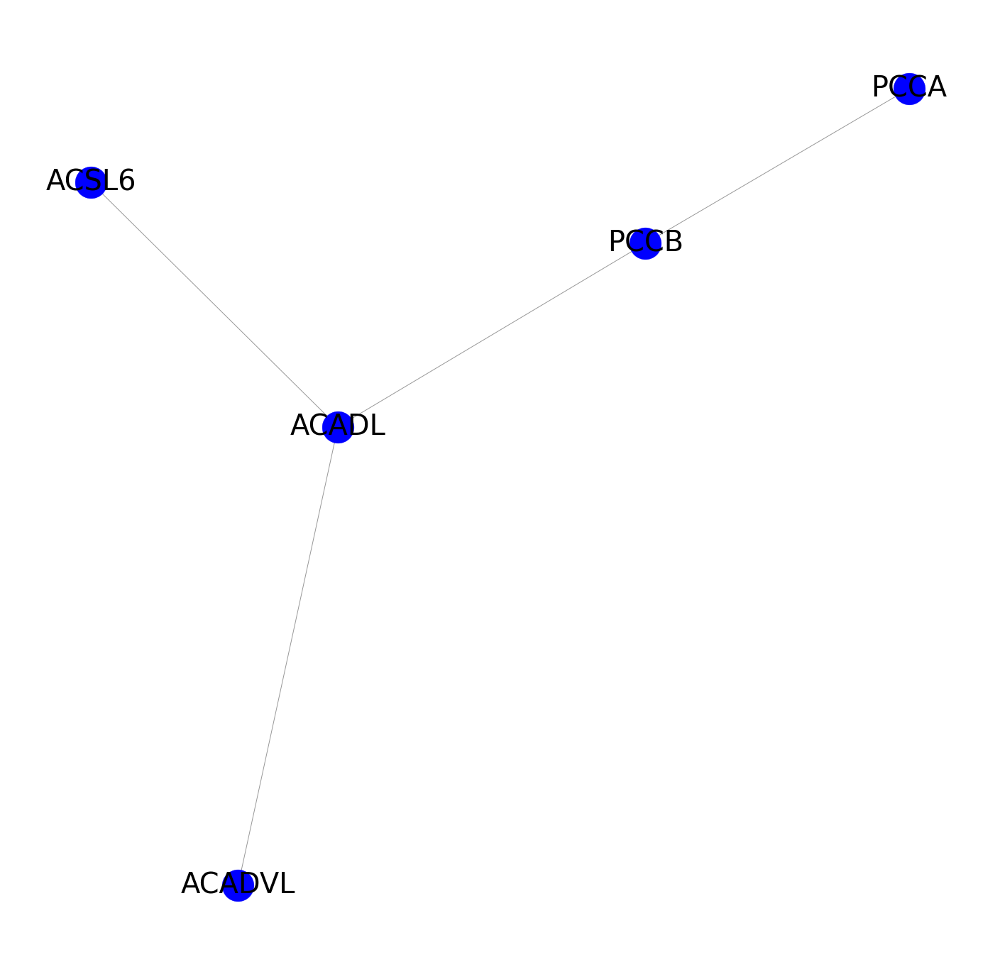

In [30]:
#Let's plot these core networks
import matplotlib.pyplot as plt
plt.figure(figsize=(25,25))
up_regulated_connected_genes=homo_core_modules['upregulated_degs_1']
G_homo_up_sub_network=nx.subgraph(G_homo_string_full_hc,up_regulated_connected_genes)
size=2000
# E D G E S 
opacity_nodes = 1
edge_color = 'grey'
edge_width = 1
opacity_edges = 0.8

#size = draw_node_size(backbone_ss_exposure_network_community_subnetwork, degs, node_factor) # node size based on degree
posG_spring = nx.spring_layout(G_homo_up_sub_network)
nx.draw_networkx_nodes(G_homo_up_sub_network, pos = posG_spring, linewidths = 0.5, node_color='blue', node_size=size, node_shape='o', alpha = opacity_nodes)
nx.draw_networkx_edges(G_homo_up_sub_network, pos = posG_spring, width = edge_width, edge_color = edge_color, alpha = opacity_edges)
nx.draw_networkx_labels(G_homo_up_sub_network,pos=posG_spring,font_size=40)
plt.box(False)

plt.show() 

In [ ]:
#Let's plot these core networks
import matplotlib.pyplot as plt
plt.figure(figsize=(30,30))
up_regulated_connected_genes=homo_core_modules['upregulated_degs_2']
G_homo_up_sub_network=nx.subgraph(G_homo_string_full_hc,up_regulated_connected_genes)
size=20000
# E D G E S 
opacity_nodes = 1
edge_color = 'grey'
edge_width = 10
opacity_edges = 1

#size = draw_node_size(backbone_ss_exposure_network_community_subnetwork, degs, node_factor) # node size based on degree
posG_spring = nx.spring_layout(G_homo_up_sub_network)
nx.draw_networkx_nodes(G_homo_up_sub_network, pos = posG_spring, linewidths = 0.5, node_color='#7FBF7F', node_size=size, node_shape='o', alpha = opacity_nodes)
nx.draw_networkx_edges(G_homo_up_sub_network, pos = posG_spring, width = edge_width, edge_color = edge_color, alpha = opacity_edges)
#nx.draw_networkx_labels(G_homo_up_sub_network,pos=posG_spring,font_size=80)
plt.box(False)
plt.savefig('Figures/Homoupcore2.png',transparent=True)
plt.show() 

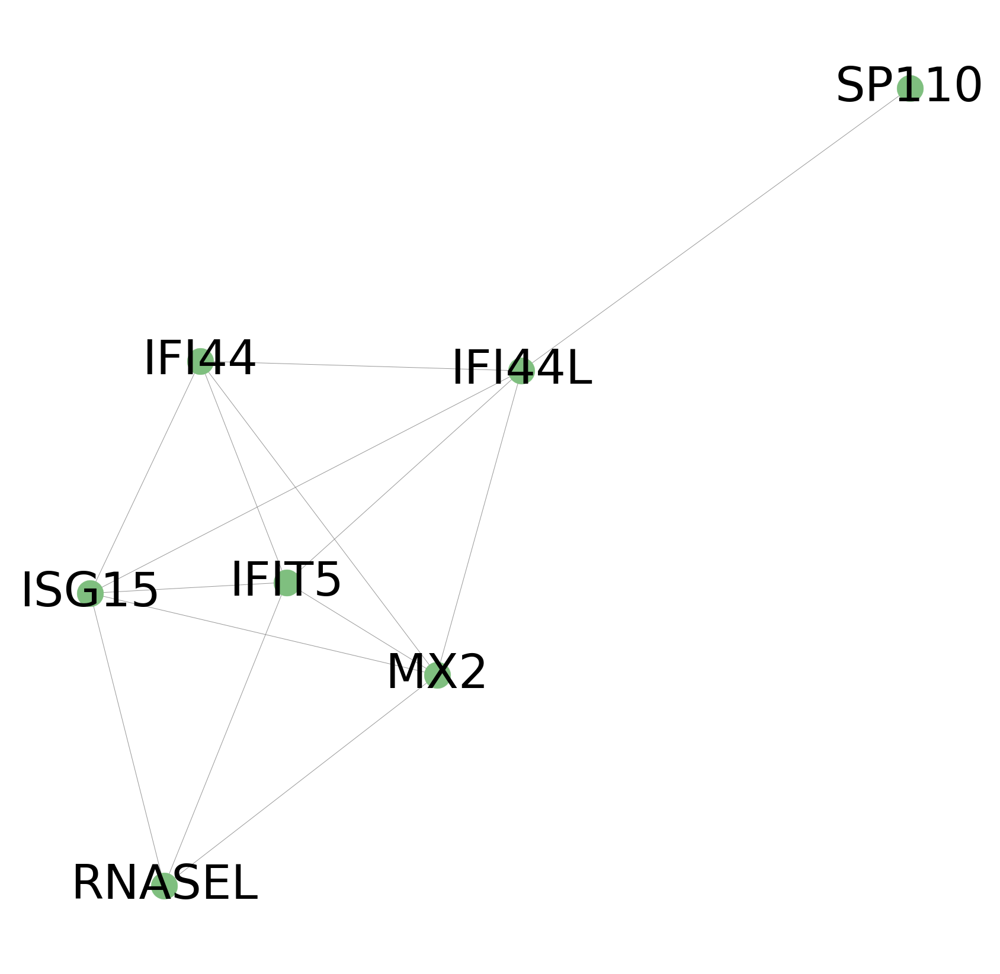

In [32]:
plt.figure(figsize=(30,30))
up_regulated_connected_genes=homo_core_modules['upregulated_degs_2']
G_homo_up_sub_network=nx.subgraph(G_homo_string_full_hc,up_regulated_connected_genes)
posG_spring = nx.spring_layout(G_homo_up_sub_network)
nx.draw_networkx_nodes(G_homo_up_sub_network, pos = posG_spring, linewidths = 0.5, node_color='#7FBF7F', node_size=size, node_shape='o', alpha = opacity_nodes)
nx.draw_networkx_edges(G_homo_up_sub_network, pos = posG_spring, width = edge_width, edge_color = edge_color, alpha = opacity_edges)
nx.draw_networkx_labels(G_homo_up_sub_network,pos=posG_spring,font_size=80)
plt.box(False)
#plt.savefig('Figures/Homoupcore2.png',transparent=True)
plt.show() 

In [ ]:
#Let's plot these core networks
import matplotlib.pyplot as plt
plt.figure(figsize=(30,30))
up_regulated_connected_genes=homo_core_modules['upregulated_degs_2']
G_homo_up_sub_network=nx.subgraph(G_homo_string_full_hc,up_regulated_connected_genes)

# E D G E S 
opacity_nodes = 1
edge_color = 'grey'
edge_width = 10
opacity_edges = 0.8

scalef = 200
x = 20
#ring_frac = np.sqrt((x-1.)/x)
ring_frac = (x-8.)/x

posG_spring = nx.spring_layout(G_homo_up_sub_network)
l_x = []
l_y = []
l_size_outer = []
l_size_inner = []
color_inner = []
color_outer = []
for node in G_homo_up_sub_network.nodes():

    #k = nx.degree(G_ppi,node)
    k=100
    R = scalef*(1+k**1.3)
    r = ring_frac * R
    l_size_outer.append(R)
    l_size_inner.append(r)
    l_x.append(posG_spring[node][0])
    l_y.append(posG_spring[node][1])
    color_inner.append('#7FBF7F')
    if node in pig_core_modules['upregulated_degs_2']:
        color_outer.append('#7F7FFF')
    else:
        color_outer.append('#7FBF7F')


plt.scatter(l_x,l_y,s=l_size_outer,c = color_outer,edgecolors='k',zorder=2)
plt.scatter(l_x,l_y,s=l_size_inner,c = color_inner,label = 'genes',zorder=2,alpha=.8)

#nx.draw_networkx_nodes(G_homo_up_sub_network, pos = posG_spring, linewidths = 0.5, node_color='red', node_size=size, node_shape='o', alpha = opacity_nodes)
nx.draw_networkx_edges(G_homo_up_sub_network, pos = posG_spring, width = edge_width, edge_color = edge_color, alpha = opacity_edges)
#nx.draw_networkx_labels(G_homo_up_sub_network,pos=posG_spring,font_size=40)
plt.box(False)
plt.savefig('Figures/Upcore2.png',transparent=True)
plt.show() 

In [ ]:
#Let's plot these core networks
import matplotlib.pyplot as plt
plt.figure(figsize=(30,30))
down_regulated_connected_genes=homo_core_modules['downregulated_degs']
G_homo_down_sub_network=nx.subgraph(G_homo_string_full_hc,down_regulated_connected_genes)

# E D G E S 
opacity_nodes = 1
edge_color = 'grey'
edge_width = 10
opacity_edges = 0.8

scalef = 50
x = 20
#ring_frac = np.sqrt((x-1.)/x)
ring_frac = (x-8.)/x

posG_spring = nx.spring_layout(G_homo_down_sub_network)
l_x = []
l_y = []
l_size_outer = []
l_size_inner = []
color_inner = []
color_outer = []
for node in G_homo_down_sub_network.nodes():

    #k = nx.degree(G_ppi,node)
    k=100
    R = scalef*(1+k**1.3)
    r = ring_frac * R
    l_size_outer.append(R)
    l_size_inner.append(r)
    l_x.append(posG_spring[node][0])
    l_y.append(posG_spring[node][1])
    color_inner.append('#7FBF7F')
    if node in pig_core_modules['downregulated_degs']:
        color_outer.append('#7F7FFF')
    else:
        color_outer.append('#7FBF7F')


plt.scatter(l_x,l_y,s=l_size_outer,c = color_outer,edgecolors='k',zorder=2)
plt.scatter(l_x,l_y,s=l_size_inner,c = color_inner,label = 'genes',zorder=2,alpha=.8)

#nx.draw_networkx_nodes(G_homo_down_sub_network, pos = posG_spring, linewidths = 0.5, node_color='red', node_size=size, node_shape='o', alpha = opacity_nodes)
nx.draw_networkx_edges(G_homo_down_sub_network, pos = posG_spring, width = edge_width, edge_color = edge_color, alpha = opacity_edges)
nx.draw_networkx_labels(G_homo_down_sub_network,pos=posG_spring,font_size=40)
plt.box(False)
plt.savefig('Figures/Downcore.png',transparent=True)
plt.show() 

In [ ]:
#Let's apply the partial expansion

In [ ]:

num_nodes = G_homo_string_full_hc.number_of_nodes()                                         
A = nx.adjacency_matrix(G_homo_string_full_hc)                                
W = rnd_walk_matrix(A, r, alpha, num_nodes)                             
d_idx_sym = {}                                                              
cc = 0                                                                      
for sym in G_homo_string_full_hc.nodes():                                              
    d_idx_sym[cc] = sym                                                   
    cc += 1                                                                 
d_sym_idx = dict((y,x) for x,y in d_idx_sym.items()) 


homo_degs_expanded_modules_dict={}
for deg_name,deg_list in deg_dict.items():
    connectivness_dict={}
    geneset=set(deg_list)&G_homo_string_full_hc.nodes()
    nodeset = []
    for s_ent in geneset:
        nodeset.append(d_sym_idx[s_ent])
    normprob = len(nodeset)
    p0 = np.zeros(G_homo_string_full_hc.number_of_nodes())
    # generate start vector
    for n in range(len(p0)):
        if n in nodeset:
            p0[n] = 1.
    pinf =  np.array(W.dot(p0))
    # DICT WITH NODE ID AND PVIS 
    d_n_p = {}
    i = 0
    for x in pinf:
    #     print(i,x)
        d_n_p[d_idx_sym[i]] = x/normprob
        i += 1  
    pcum = 0
    l_rndwnodes = []
    cc = 0
    for node, pvis in sorted(d_n_p.items(), key = lambda x: x[1], reverse = True):
        pcum += pvis
        l_rndwnodes.append(node)
        G_deg_condition = G_homo_string_full_hc.subgraph(l_rndwnodes)  
        G_deg_condition_components = [G_deg_condition.subgraph(c).copy() for c in nx.connected_components(G_deg_condition)]
        for c in G_deg_condition_components:
            if len(c.nodes()&geneset)/len(geneset)>0.8:
                connectivness_dict[cc]=[list(c.nodes()),len(c.nodes()&geneset)/len(geneset)]
        if nx.is_connected(G_deg_condition) and cc>len(nodeset):
            break
        cc += 1

    homo_degs_expanded_modules_dict[deg_name]=[G_deg_condition,connectivness_dict]
    

In [ ]:
#Let's write these results
with open('output/homo_degs_expanded_modules_dict.pickle', 'wb') as handle:
    pk.dump(homo_degs_expanded_modules_dict, handle, protocol=pk.HIGHEST_PROTOCOL)

In [ ]:
#Let's import the results
with open('output/homo_degs_expanded_modules_dict.pickle', 'rb') as handle:
    homo_degs_expanded_modules_dict = pk.load(handle)

In [ ]:


homo_upregulated_degs_intersection_825=homo_degs_expanded_modules_dict['upregulated_degs'][1][169+homo_upregulated_degs_intersection.index(0.8245614035087719)][0]
homo_upregulated_degs_intersection_895=homo_degs_expanded_modules_dict['upregulated_degs'][1][169+homo_upregulated_degs_intersection.index(0.8947368421052632)][0]



homo_downregulated_degs_intersection_857=homo_degs_expanded_modules_dict['downregulated_degs'][1][300+homo_downregulated_degs_intersection.index(0.8571428571428571)][0]
homo_downregulated_degs_intersection_892=homo_degs_expanded_modules_dict['downregulated_degs'][1][300+homo_downregulated_degs_intersection.index(0.8928571428571429)][0]



homo_tot_degs_intersection_875=homo_degs_expanded_modules_dict['tot_degs'][1][300+homo_tot_degs_intersection.index(0.8761061946902655)][0]


In [ ]:
partially_expanded_degs={}
partially_expanded_degs["up_825"]=homo_upregulated_degs_intersection_825
partially_expanded_degs["up_895"]=homo_upregulated_degs_intersection_895
partially_expanded_degs["down_857"]=homo_downregulated_degs_intersection_857
partially_expanded_degs["down_892"]=homo_downregulated_degs_intersection_892
partially_expanded_degs["tot_875"]=homo_tot_degs_intersection_875

new_partially_expanded_deg_diseases_homostring_hc_overlap_fdr_dict={}

genebackground=G_homo_string_full_hc.number_of_nodes()
homo_degs_network_dis_overlap_pvalue_dict={}

for condition,degs_list in partially_expanded_degs.items():
    deg_network=set(degs_list)&G_homo_string_full_hc.nodes()
    overlapped_disease_dict={}
    for dis,geneset in disgenet_gda_curated_score_name.items():
        dis_genes_network=set(geneset)&G_homo_string_full_hc.nodes()
        pval=overlap_genelists(deg_network,dis_genes_network,genebackground)
        overlapped_disease_dict[dis]=float(pval)
    homo_degs_network_dis_overlap_pvalue_dict[condition]=overlapped_disease_dict
        

for condition,overlapped_disease_dict in homo_degs_network_dis_overlap_pvalue_dict.items():
    adj_pvals=fdr_adjustment(list(overlapped_disease_dict.values()),alpha=0.05)
    dis_keys_list=list(overlapped_disease_dict.keys())
    overlapped_disease_pval_adj={}
    for el in range(len(dis_keys_list)):
        overlapped_disease_pval_adj[dis_keys_list[el]]=adj_pvals[el]

    significantly_overlapped_disease_pval_adj={}
    for k,v in overlapped_disease_pval_adj.items():
        if v<0.05:
            significantly_overlapped_disease_pval_adj[k]=v
        else:
            pass
    new_partially_expanded_deg_diseases_homostring_hc_overlap_fdr_dict[condition]=significantly_overlapped_disease_pval_adj


In [ ]:

G_homo_up_sub_network=nx.subgraph(G_homo_string_full_hc,homo_upregulated_degs_intersection_895)
G_homo_down_sub_network=nx.subgraph(G_homo_string_full_hc,homo_downregulated_degs_intersection_892)

In [ ]:
#By comparing the edges of these two networks, we can see that they are very different

def overlap_jaccard(list1,list2):
    intersction_term= len(set(list1) & set(list2))
    denominator = len(set(list1).union(set(list2)))
    overlap_jaccard_coeff = intersction_term/denominator
    return overlap_jaccard_coeff

list1_t=list(map(tuple, list(G_homo_up_sub_network.edges())))
list1_d=list(set([tuple(sorted(t)) for t in list1_t ]))
list2_t=list(map(tuple, list(G_homo_down_sub_network.edges())))
list2_d=list(set([tuple(sorted(t)) for t in list2_t ]))
overlap_jaccard(list1_d,list2_d)

In [ ]:
libraries=['KEGG','GOBP','GOCC','GOMF']
expanded_up_enrichment_terms=pd.DataFrame()
for lib in libraries:
    partially_expanded_up_df=enr_df_dict(homo_proximal_geneset_dict['partially_expanded_up'])
    df_sel=partially_expanded_up_df[lib].res2d[partially_expanded_up_df[lib].res2d['Adjusted P-value']<0.05]
    expanded_up_enrichment_terms=expanded_up_enrichment_terms.append(df_sel)

In [ ]:
expanded_up_enrichment_terms.to_csv("Tables/expanded_up_enrichment_terms",index=False)

In [ ]:
libraries=['KEGG','GOBP','GOCC','GOMF']
expanded_down_enrichment_terms=pd.DataFrame()
for lib in libraries:
    partially_expanded_down_df=enr_df_dict(homo_proximal_geneset_dict['partially_expanded_down'])
    df_sel=partially_expanded_down_df[lib].res2d[partially_expanded_down_df[lib].res2d['Adjusted P-value']<0.05]
    expanded_down_enrichment_terms=expanded_down_enrichment_terms.append(df_sel)

In [ ]:
expanded_down_enrichment_terms.to_csv("Tables/expanded_down_enrichment_terms",index=False)

In [ ]:
#Let's import the extended list of significant p-values
pig_extended_df=pd.read_excel("diff_abundantprots_extended.xlsx", sheet_name="Sheet1")


#Let's define the up- and down-regulated abundant proteins in the experiment
upregulated_extended_degs=[]
downregulated_extended_degs=[]

for i,v in pig_extended_df.iterrows():
    if v['l2fc group (HG/NG)']=='Increased in HG':
        upregulated_extended_degs.append(v['Genes'])
    else:
        downregulated_extended_degs.append(v['Genes'])
print(len(upregulated_extended_degs))
print(len(downregulated_extended_degs))

In [ ]:
#Let's plot these expanded core networks
import matplotlib.pyplot as plt
plt.figure(figsize=(30,30))

G_homo_up_sub_network=nx.subgraph(G_homo_string_full_hc,homo_proximal_geneset_dict['partially_expanded_up'])

# E D G E S 
opacity_nodes = 1
edge_color = 'grey'
edge_width = 10
opacity_edges = 0.8

scalef = 20
x = 20
#ring_frac = np.sqrt((x-1.)/x)
ring_frac = (x-8.)/x

posG_spring = nx.spring_layout(G_homo_up_sub_network)
l_x = []
l_y = []
l_size_outer = []
l_size_inner = []
color_inner = []
color_outer = []
for node in G_homo_up_sub_network.nodes():

    #k = nx.degree(G_ppi,node)
    k=20
    R = scalef*(1+k**1.3)
    r = ring_frac * R
    l_size_outer.append(R)
    l_size_inner.append(r)
    l_x.append(posG_spring[node][0])
    l_y.append(posG_spring[node][1])
    
    if node in deg_dict['upregulated_degs']:
        color_outer.append('red')
        color_inner.append('red')
    elif node in deg_dict['downregulated_degs']:
        color_outer.append('blue')
        color_inner.append('blue')
    elif node in upregulated_extended_degs:
        color_inner.append('red') 
        color_outer.append('red')
    elif node in downregulated_extended_degs:
        color_inner.append('blue') 
        color_outer.append('blue')
    else:
        color_inner.append('yellow') 
        color_outer.append('yellow')


plt.scatter(l_x,l_y,s=l_size_outer,c = color_outer,edgecolors='k',zorder=2)
plt.scatter(l_x,l_y,s=l_size_inner,c = color_inner,label = 'genes',zorder=2,alpha=.8)

#nx.draw_networkx_nodes(G_homo_up_sub_network, pos = posG_spring, linewidths = 0.5, node_color='red', node_size=size, node_shape='o', alpha = opacity_nodes)
nx.draw_networkx_edges(G_homo_up_sub_network, pos = posG_spring, width = edge_width, edge_color = edge_color, alpha = opacity_edges)
#nx.draw_networkx_labels(G_homo_up_sub_network,pos=posG_spring,font_size=40)
plt.box(False)
plt.savefig('Figures/Partially_expanded_up_020223.png',transparent=True)
plt.show() 

### Disease

In [ ]:
# Let's import a set of gene-disease associations well-curated
# using the API from https://www.disgenet.org/home/
# This step can take up to some hours

disgenet_disease_associations_df=pd.read_csv("input/disease_associations.tsv",sep="\t")
disease_id_set=set(disgenet_disease_associations_df['diseaseId'].tolist())

disgenet_gda_curated_score={}
import requests

#Build a dict with the following format, change the value of the two keys your DisGeNET account credentials, if you don't have an account you can create one here https://www.disgenet.org/signup/ 
auth_params = {"email":"insert your account here","password":"insert your password here"}

api_host = "https://www.disgenet.org/api"

api_key = None
s = requests.Session()
try:
    r = s.post(api_host+'/auth/', data=auth_params)
    if(r.status_code == 200):
        #Lets store the api key in a new variable and use it again in new requests
        json_response = r.json()
        api_key = json_response.get("token")
        print(api_key + "This is your user API key.") #Comment this line if you don't want your API key to show up in the terminal
    else:
        print(r.status_code)
        print(r.text)
except requests.exceptions.RequestException as req_ex:
    print(req_ex)
    print("Something went wrong with the request.")

if api_key:
    #Add the api key to the requests headers of the requests Session object in order to use the restricted endpoints.
    s.headers.update({"Authorization": "Bearer %s" % api_key}) 
    for dis in disease_id_set:
        try:
            try:
                gda_response = s.get(api_host+'/gda/disease/%s'%dis, params={'source':'CURATED','min_score':0.5,'limit':5000})
                genelist=[]
                for i in range(len(gda_response.json())):
                    genelist.append(gda_response.json()[i]['gene_symbol'])
                disgenet_gda_curated_score[dis]=genelist
            except:
                gda_response = s.get(api_host+'/gda/disease/%s'%dis, params={'source':'CURATED','min_score':0.3,'limit':5000})
                genelist=[]
                for i in range(len(gda_response.json())):
                    genelist.append(gda_response.json()[i]['gene_symbol'])
                disgenet_gda_curated_score[dis]=genelist
        except:
            pass
        
        
#Let's write it
with open('input/disgenet_gda_curated_score.pickle', 'wb') as handle:
    pk.dump(disgenet_gda_curated_score, handle, protocol=pk.HIGHEST_PROTOCOL)


In [ ]:
#Let's import it and change the disease ids to names
with open('disgenet_gda_curated_score.pickle', 'rb') as handle:
    disgenet_gda_curated_score = pk.load(handle)
disgenet_gda_curated_score_name={}
for dis_id,geneset in disgenet_gda_curated_score.items():
    disgenet_gda_curated_score_name[disgenet_disease_associations_df[disgenet_disease_associations_df['diseaseId']==dis_id]['diseaseName'].values[0]]=geneset


In [ ]:
#Let's define a function to calculate the genetic overlap between two lists
def overlap_genelists(lstA, lstB,genebackground):
    import scipy.stats as stats
    """
    Accepts to lists
    M is the population size (previously N)
    n is the number of successes in the population
    N is the sample size (previously n)
    x is still the number of drawn “successes”
    """
    setA= set(lstA)
    setB= set(lstB)
    M= genebackground #total number of genes
    n= len(setA)
    N= len(setB)
    x= len(setA.intersection(setB))


    return str(stats.hypergeom.sf(x-1, M, n, N))

#Let's adjust the p-values by using a Benjamini-Hochberg correction
from statsmodels.sandbox.stats.multicomp import multipletests
def fdr_adjustment(list_of_pvals,alpha):    
    return multipletests(list_of_pvals,alpha=alpha,method='fdr_bh')[1] #the benjamin hochberg method is used
    

In [41]:
#Homo degs


new_deg_diseases_homostringnetworks_overlap_fdr_dict={}
for network_name, network in homo_networks_dict.items():
    genebackground=network.number_of_nodes()
    homo_degs_network_dis_overlap_pvalue_dict={}

    for condition,degs in deg_dict.items():
        deg_network=set(degs)&network.nodes()
        overlapped_disease_dict={}
        for dis,geneset in disgenet_gda_curated_score_name.items():
            dis_genes_network=geneset=set(geneset)&network.nodes()
            pval=overlap_genelists(deg_network,dis_genes_network,genebackground)
            overlapped_disease_dict[dis]=float(pval)
        homo_degs_network_dis_overlap_pvalue_dict[condition]=overlapped_disease_dict
        
    homo_degs_network_dis_overlap_fdr_significant={}
    for condition,overlapped_disease_dict in homo_degs_network_dis_overlap_pvalue_dict.items():
        adj_pvals=fdr_adjustment(list(overlapped_disease_dict.values()),alpha=0.05)
        dis_keys_list=list(overlapped_disease_dict.keys())
        overlapped_disease_pval_adj={}
        for el in range(len(dis_keys_list)):
            overlapped_disease_pval_adj[dis_keys_list[el]]=adj_pvals[el]

        significantly_overlapped_disease_pval_adj={}
        for k,v in overlapped_disease_pval_adj.items():
            if v<0.05:
                significantly_overlapped_disease_pval_adj[k]=v
            else:
                pass
        homo_degs_network_dis_overlap_fdr_significant[condition]=significantly_overlapped_disease_pval_adj
        
    new_deg_diseases_homostringnetworks_overlap_fdr_dict[network_name]=homo_degs_network_dis_overlap_fdr_significant
        


In [42]:
new_deg_diseases_homostringnetworks_overlap_fdr_dict

{'G_homo_string_full': {'upregulated_degs': {'Propionicaciduria': 0.024420353060010974,
   'Cirrhosis, Familial': 0.024420353060010974,
   'Influenza': 0.004721621672462352,
   'Propionic acidemia': 0.024420353060010974},
  'downregulated_degs': {},
  'tot_degs': {}},
 'G_homo_string_full_hc': {'upregulated_degs': {'Propionicaciduria': 0.031409138832461755,
   'Cirrhosis, Familial': 0.031409138832461755,
   'Influenza': 0.008715353980932915,
   'Propionic acidemia': 0.031409138832461755},
  'downregulated_degs': {},
  'tot_degs': {}},
 'G_homo_string_physical': {'upregulated_degs': {'Propionicaciduria': 0.027149686085462973,
   'Cirrhosis, Familial': 0.027149686085462973,
   'Influenza': 0.006118590445075774,
   'Propionic acidemia': 0.027149686085462973},
  'downregulated_degs': {},
  'tot_degs': {}},
 'G_homo_string_physical_hc': {'upregulated_degs': {'Propionicaciduria': 0.03758455892751218,
   'Cirrhosis, Familial': 0.03758455892751218,
   'Propionic acidemia': 0.03758455892751218}

In [232]:
#Homo degs expanded 

new_expanded_deg_diseases_homostringnetworks_overlap_fdr_dict={}
for network_name, network in homo_networks_dict.items():
    genebackground=network.number_of_nodes()
    homo_degs_network_dis_overlap_pvalue_dict={}

    for condition,degs in deg_dict.items():
        expanded_deglist=list(homo_networks_expanded_modules_dict[network_name][condition].nodes)
        overlapped_disease_dict={}
        for dis,geneset in disgenet_gda_curated_score_name.items():
            dis_genes_network=geneset=set(geneset)&network.nodes()
            pval=overlap_genelists(expanded_deglist,dis_genes_network,genebackground)
            overlapped_disease_dict[dis]=float(pval)
        homo_degs_network_dis_overlap_pvalue_dict[condition]=overlapped_disease_dict
        
    homo_degs_network_dis_overlap_fdr_significant={}
    for condition,overlapped_disease_dict in homo_degs_network_dis_overlap_pvalue_dict.items():
        adj_pvals=fdr_adjustment(list(overlapped_disease_dict.values()),alpha=0.05)
        dis_keys_list=list(overlapped_disease_dict.keys())
        overlapped_disease_pval_adj={}
        for el in range(len(dis_keys_list)):
            overlapped_disease_pval_adj[dis_keys_list[el]]=adj_pvals[el]

        significantly_overlapped_disease_pval_adj={}
        for k,v in overlapped_disease_pval_adj.items():
            if v<0.05:
                significantly_overlapped_disease_pval_adj[k]=v
            else:
                pass
        significantly_overlapped_disease_pval_adj_sorted=dict(sorted(significantly_overlapped_disease_pval_adj.items(), key=lambda item: item[1]))
        homo_degs_network_dis_overlap_fdr_significant[condition]=significantly_overlapped_disease_pval_adj_sorted

    new_expanded_deg_diseases_homostringnetworks_overlap_fdr_dict[network_name]=homo_degs_network_dis_overlap_fdr_significant
  

In [234]:
new_expanded_deg_diseases_homostringnetworks_overlap_fdr_dict['G_homo_string_full_hc']

{'upregulated_degs': {'Influenza': 1.942512621400174e-21,
  'Undifferentiated carcinoma': 6.215518751195658e-14,
  'Carcinomatosis': 6.215518751195658e-14,
  'Anaplastic carcinoma': 6.215518751195658e-14,
  'Carcinoma, Spindle-Cell': 6.215518751195658e-14,
  'Alloxan Diabetes': 6.366836109882184e-14,
  'Mammary Carcinoma, Animal': 3.613949026937928e-11,
  'Animal Mammary Neoplasms': 3.613949026937928e-11,
  'Diabetes Mellitus, Experimental': 6.86315031696758e-11,
  'Arthritis, Adjuvant-Induced': 4.1546229278917206e-10,
  'Arthritis, Experimental': 4.1546229278917206e-10,
  'Arthritis, Collagen-Induced': 4.1546229278917206e-10,
  'Cardiac Hypertrophy': 1.4455571155944827e-09,
  'Atherogenesis': 2.2792509170784156e-08,
  'Cholestasis, Extrahepatic': 2.3502613060932478e-08,
  'Acute Confusional Senile Dementia': 2.8072321284312893e-08,
  'Presenile dementia': 2.8072321284312893e-08,
  "Alzheimer's Disease, Focal Onset": 2.8072321284312893e-08,
  'Alzheimer Disease, Late Onset': 2.80723212

In [ ]:
new_deg_diseases_homostring_hc_overlap_fdr_dict={}

genebackground=G_homo_string_full_hc.number_of_nodes()
homo_degs_network_dis_overlap_pvalue_dict={}

for condition,degs_list in homo_core_modules.items():
    deg_network=set(degs_list)&G_homo_string_full_hc.nodes()
    overlapped_disease_dict={}
    for dis,geneset in disgenet_gda_curated_score_name.items():
        dis_genes_network=set(geneset)&G_homo_string_full_hc.nodes()
        pval=overlap_genelists(deg_network,dis_genes_network,genebackground)
        overlapped_disease_dict[dis]=float(pval)
    homo_degs_network_dis_overlap_pvalue_dict[condition]=overlapped_disease_dict
        

for condition,overlapped_disease_dict in homo_degs_network_dis_overlap_pvalue_dict.items():
    adj_pvals=fdr_adjustment(list(overlapped_disease_dict.values()),alpha=0.05)
    dis_keys_list=list(overlapped_disease_dict.keys())
    overlapped_disease_pval_adj={}
    for el in range(len(dis_keys_list)):
        overlapped_disease_pval_adj[dis_keys_list[el]]=adj_pvals[el]

    significantly_overlapped_disease_pval_adj={}
    for k,v in overlapped_disease_pval_adj.items():
        if v<0.05:
            significantly_overlapped_disease_pval_adj[k]=v
        else:
            pass
    new_deg_diseases_homostring_hc_overlap_fdr_dict[condition]=significantly_overlapped_disease_pval_adj


In [ ]:
homo_deg_disease_ji_fdr_df=pd.DataFrame()

cond_list=[]
dis_list=[]
fdr_list=[]

for cond,dis_dict in new_deg_diseases_homostring_hc_overlap_fdr_dict.items():
    if cond=='upregulated_degs_1':
        for dis,fdr in dis_dict.items():
            cond_list.append("Upregulated core 1")
            dis_list.append(dis)
            fdr_list.append(fdr)
    elif cond=='upregulated_degs_2':
        for dis,fdr in dis_dict.items():
            cond_list.append("Upregulated core 2")
            dis_list.append(dis)
            fdr_list.append(fdr)
 
for cond,dis_dict in new_partially_expanded_deg_diseases_homostring_hc_overlap_fdr_dict.items():
    if cond=='up_895':
        for dis,fdr in dis_dict.items():
            cond_list.append("Expanded upregulated network")
            dis_list.append(dis)
            fdr_list.append(fdr)
    elif cond=='down_892':
        for dis,fdr in dis_dict.items():
            cond_list.append("Expanded downregulated network")
            dis_list.append(dis)
            fdr_list.append(fdr)
            
homo_deg_disease_ji_fdr_df['Condition']=cond_list
homo_deg_disease_ji_fdr_df['Disease']=dis_list
homo_deg_disease_ji_fdr_df['FDR']=fdr_list

In [ ]:
homo_deg_disease_ji_fdr_df.to_csv("Tables/homo_deg_disease_ji_fdr_df.csv",index=False)

In [ ]:
#Let's prepare a set of genes that we will test for proximity against all diseases


homo_proximal_geneset_dict={}
#core modules
for cond,genelist in homo_core_modules.items():
    homo_proximal_geneset_dict["core_"+cond]=genelist


#all degs

for cond,genelist in deg_dict.items():
    homo_proximal_geneset_dict["tot"+cond]=genelist

#partially expanded

homo_proximal_geneset_dict["partially_expanded_tot"]=homo_tot_degs_intersection_875
homo_proximal_geneset_dict["partially_expanded_up"]=homo_upregulated_degs_intersection_895
homo_proximal_geneset_dict["partially_expanded_down"]=homo_downregulated_degs_intersection_892

In [ ]:
#Let's write the set of proteins for which we will run the proximity algorithm
with open('output/homo_proximal_geneset_dict.pickle', 'wb') as handle:
    pk.dump(homo_proximal_geneset_dict, handle, protocol=pk.HIGHEST_PROTOCOL)

In [ ]:
#This steps will run on a cluster
#It requires first to compute all shortest path distances between nodes in the human PPI
#This can be done by running the file string_hc_homo_networks_spl.py

#Afterwards, it will be possible to compute the network distances and proximity between genesets in the network
#by using the scripte homo_degs_proximity.py

#Please make sure to have downloaded the interaction files 
#and metadata from STRING (9606.protein.info.v11.5.txt and 9606.protein.links.v11.5.txt)



In [ ]:
#Let's import the proximal diseases-degs relationships

In [ ]:
with open('output/homo_proximal_geneset_dict.pickle', 'rb') as handle:
    homo_proximal_geneset_dict = pk.load(handle)
with open('output/homo_degs_network_proximity.pickle', 'rb') as handle:
    homo_degs_network_proximity = pk.load(handle)

In [ ]:
#Let's convert these proximity values to p-values

  
homo_degs_network_proximity_pval={}

for condition in list(homo_proximal_geneset_dict.keys()):
    dis_list=[]
    pval_list=[]
    for cond_dis_pair,z_dict in homo_degs_network_proximity.items():
        if condition==cond_dis_pair[0]:
            dis_list.append(cond_dis_pair[1])
            pval_list.append(scipy.stats.norm.sf(-(z_dict[1])))
            homo_degs_network_proximity_pval[condition]=[dis_list,pval_list]

In [ ]:
import statsmodels.stats as stat                          #here, we apply a FDR adjustment on the p-values calculated
def fdr_adjustment(list_of_pvals):                       
    return stat.multitest.fdrcorrection(list_of_pvals)[1] 
    
    
homo_degs_network_proximity_fdr_significant={}
for condition,dis_pval_list in homo_degs_network_proximity_pval.items():
    adj_pvals=fdr_adjustment(dis_pval_list[1])
    dis_list=dis_pval_list[0]
    overlapped_disease_pval_adj={}
    for el in range(len(adj_pvals)):
        overlapped_disease_pval_adj[dis_list[el]]=adj_pvals[el]

    significantly_overlapped_disease_pval_adj={}
    for k,v in overlapped_disease_pval_adj.items():
        if v<0.05:
            significantly_overlapped_disease_pval_adj[k]=v
        else:
            pass
        significantly_overlapped_disease_pval_adj_sorted=dict(sorted(significantly_overlapped_disease_pval_adj.items(), key=lambda item: item[1]))
    homo_degs_network_proximity_fdr_significant[condition]=significantly_overlapped_disease_pval_adj_sorted
   

In [ ]:
homo_deg_disease_proximity_fdr_df=pd.DataFrame()

cond_list=[]
dis_list=[]
fdr_list=[]

for cond,dis_dict in homo_degs_network_proximity_fdr_significant.items():
    if cond=='core_upregulated_degs_1':
        for dis,fdr in dis_dict.items():
            cond_list.append("Upregulated core 1")
            dis_list.append(dis)
            fdr_list.append(fdr)
    elif cond=='core_upregulated_degs_2':
        for dis,fdr in dis_dict.items():
            cond_list.append("Upregulated core 2")
            dis_list.append(dis)
            fdr_list.append(fdr)
    elif cond=='core_downregulated_degs':
        for dis,fdr in dis_dict.items():
            cond_list.append("Downregulated core")
            dis_list.append(dis)
            fdr_list.append(fdr)
    elif cond=='partially_expanded_up':
        for dis,fdr in dis_dict.items():
            cond_list.append("Expanded upregulated network")
            dis_list.append(dis)
            fdr_list.append(fdr)
    elif cond=='partially_expanded_down':
        for dis,fdr in dis_dict.items():
            cond_list.append("Expanded downregulated network")
            dis_list.append(dis)
            fdr_list.append(fdr)

            
homo_deg_disease_proximity_fdr_df['Condition']=cond_list
homo_deg_disease_proximity_fdr_df['Disease']=dis_list
homo_deg_disease_proximity_fdr_df['FDR']=fdr_list

In [ ]:
homo_deg_disease_proximity_fdr_df.to_csv("Tables/homo_deg_disease_proximity_fdr_df.csv",index=False)

In [ ]:
len(homo_degs_network_proximity_fdr_significant['core_upregulated_degs_1'])

In [ ]:
homo_degs_network_proximity_fdr_significant['core_upregulated_degs_1']

In [2]:
#Let's define a set of interesting metabolic proximal diseases
interesting_metabolism_diseases=["Propionicaciduria",
'Propionic acidemia',
'Finding of Mean Corpuscular Hemoglobin',
'Lipid Metabolism Disorders',
'3-methylcrotonyl CoA carboxylase 1 deficiency',
'Multiple Acyl Coenzyme A Dehydrogenase Deficiency',
'Glutaric Aciduria IIA',
'2,4-Dienoyl-CoA Reductase Deficiency',
'Glutaric Aciduria IIC',
'Glutaric Aciduria IIB',
'Lipid Metabolism, Inborn Errors',
'Hypertriglyceridemia',
'Metabolic Diseases',
'Amino Acid Metabolism, Inborn Errors',
'Hyperlipidemia',
'Fatty Liver, Alcoholic',
'Apolipoprotein A-I deficiency',
'Alcoholic Steatohepatitis',
'Biliary cirrhosis',
'Inborn Errors of Metabolism',
'Hypercholesterolemia',
'Alcoholic Liver Diseases',
'Pediatric Obesity',
'Childhood Overweight',
'Infantile Obesity',
'Adolescent Overweight',
'Adolescent Obesity',
'Obesity',
'Primary biliary cirrhosis',
'Diabetes Mellitus, Non-Insulin-Dependent']

In [ ]:
interesting_metabolism_diseases_prox_dict={}
for dis in interesting_metabolism_diseases:
    interesting_metabolism_diseases_prox_dict[dis]=homo_degs_network_proximity[('core_upregulated_degs_1',dis)][1]
 
interesting_metabolism_diseases_prox_dict_uniqueprox={}
for prox in set(list(interesting_metabolism_diseases_prox_dict.values())):
    dis_liststring=str()
    for dis,prox_val in interesting_metabolism_diseases_prox_dict.items():
        if prox==prox_val:
            G_dis_sub_network=nx.subgraph(G_homo_string_full_hc,disgenet_gda_curated_score_name[dis])
            G_dis_sub_network_sub=G_dis_sub_network.subgraph(max(nx.connected_components(G_dis_sub_network), key=len))
            if G_dis_sub_network_sub.number_of_nodes()>1:
                dis_liststring+=dis+";"
        
    interesting_metabolism_diseases_prox_dict_uniqueprox[prox]=dis_liststring
    

In [ ]:
for dis in interesting_metabolism_diseases:
    print(dis)
    print(disgenet_gda_curated_score_name[dis])

In [ ]:
#Let's look at the z-score proximal distance distribution of these metabolic disorders compared to all diseases
import matplotlib.pyplot as plt
import seaborn as sns
import random as rd
# plot distributions for non-sampled case
fig, ax = plt.subplots(figsize=(36, 36))
sns.set_style('white')
sns.set_style("ticks", {"xtick.major.size": 15, "ytick.major.size": 15})

proximity_list=[]
for condition,z_dict in homo_degs_network_proximity.items():
    if condition[0]=='core_upregulated_degs_1':
        proximity_list.append(z_dict[1])
        
interesting_metabolic_diseases_color={}
for prox,dislist in interesting_metabolism_diseases_prox_dict_uniqueprox.items():
    col = (rd.random(), rd.random(), rd.random())
    interesting_metabolic_diseases_color[dislist]=col
    plt.vlines(prox,ymin=0,ymax=1,linewidth=3,color=col,label=dislist[:-1])



sns.kdeplot(proximity_list,color='b',lw=.5,alpha=.5,shade=True,label='proximity distribution over all diseases')
plt.legend(loc='upper right',fontsize=32)

ax.set_xlabel("",fontsize=32)
ax.set_ylabel("",fontsize=32)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)
ax.set_yticklabels([round(y,2) for y in ax.get_yticks()], size = 36)
ax.set_xticklabels(ax.get_xticks(), size = 36)
plt.savefig('Figures/Metabolic_diseases_zscore_distribution.png',format='png',dpi=300, bbox_inches = "tight")
plt.show()


In [ ]:
#Let's plot all the metabolic disease modules


import matplotlib.pyplot as plt
for dis in interesting_metabolism_diseases:
    for dis_list,c in interesting_metabolic_diseases_color.items():
        if dis in dis_list:
            color=c

            G_dis_sub_network=nx.subgraph(G_homo_string_full_hc,disgenet_gda_curated_score_name[dis])
            G_dis_sub_network_sub=G_dis_sub_network.subgraph(max(nx.connected_components(G_dis_sub_network), key=len)) 
            if G_dis_sub_network_sub.number_of_nodes()<15:
                plt.figure(figsize=(15,15))
                # E D G E S 
                opacity_nodes = 1
                edge_color = 'grey'
                edge_width = 10
                opacity_edges = 0.8

                scalef = 50
                x = 20
                #ring_frac = np.sqrt((x-1.)/x)
                ring_frac = (x-8.)/x

                posG_spring = nx.spring_layout(G_dis_sub_network_sub)
                l_x = []
                l_y = []
                l_size_outer = []
                l_size_inner = []
                color_inner = []
                color_outer = []
                for node in G_dis_sub_network_sub.nodes():

                    #k = nx.degree(G_ppi,node)
                    k=100
                    R = scalef*(1+k**1.3)
                    r = ring_frac * R
                    l_size_outer.append(R)
                    l_size_inner.append(r)
                    l_x.append(posG_spring[node][0])
                    l_y.append(posG_spring[node][1])

                    if node in deg_dict['upregulated_degs']:
                        color_outer.append('red')
                        color_inner.append(color)
                    elif node in deg_dict['downregulated_degs']:
                        color_outer.append('blue')
                        color_inner.append(color)
                    elif node in upregulated_extended_degs:
                        color_inner.append(color) 
                        color_outer.append('red')
                    elif node in downregulated_extended_degs:
                        color_inner.append(color) 
                        color_outer.append('blue')
                    else:
                        color_inner.append(color) 
                        color_outer.append(color)


                plt.scatter(l_x,l_y,s=l_size_outer,c = color_outer,edgecolors='k',zorder=2)
                plt.scatter(l_x,l_y,s=l_size_inner,c = color_inner,label = 'genes',zorder=2,alpha=.99)

                #nx.draw_networkx_nodes(G_dis_sub_network_sub, pos = posG_spring, linewidths = 0.5, node_color='red', node_size=size, node_shape='o', alpha = opacity_nodes)
                nx.draw_networkx_edges(G_dis_sub_network_sub, pos = posG_spring, width = edge_width, edge_color = edge_color, alpha = opacity_edges)
                nx.draw_networkx_labels(G_dis_sub_network_sub,pos=posG_spring,font_size=40)
                plt.box(False)
                #plt.savefig('Figures/%s_network.png'%dis,transparent=True)
                plt.show() 
                plt.figure(figsize=(15,15))
                plt.scatter(l_x,l_y,s=l_size_outer,c = color_outer,edgecolors='k',zorder=2)
                plt.scatter(l_x,l_y,s=l_size_inner,c = color_inner,label = 'genes',zorder=2,alpha=.99)

                #nx.draw_networkx_nodes(G_dis_sub_network_sub, pos = posG_spring, linewidths = 0.5, node_color='red', node_size=size, node_shape='o', alpha = opacity_nodes)
                nx.draw_networkx_edges(G_dis_sub_network_sub, pos = posG_spring, width = edge_width, edge_color = edge_color, alpha = opacity_edges)
                #nx.draw_networkx_labels(G_dis_sub_network_sub,pos=posG_spring,font_size=40)
                plt.box(False)
                plt.savefig('Figures/%s_network.png'%dis,transparent=True)
                plt.show() 
            else:
                plt.figure(figsize=(25,25))
                # E D G E S 
                opacity_nodes = 1
                edge_color = 'grey'
                edge_width = 10
                opacity_edges = 0.8

                scalef = 50
                x = 20
                #ring_frac = np.sqrt((x-1.)/x)
                ring_frac = (x-8.)/x

                posG_spring = nx.spring_layout(G_dis_sub_network_sub)
                l_x = []
                l_y = []
                l_size_outer = []
                l_size_inner = []
                color_inner = []
                color_outer = []
                for node in G_dis_sub_network_sub.nodes():

                    #k = nx.degree(G_ppi,node)
                    k=100
                    R = scalef*(1+k**1.3)
                    r = ring_frac * R
                    l_size_outer.append(R)
                    l_size_inner.append(r)
                    l_x.append(posG_spring[node][0])
                    l_y.append(posG_spring[node][1])

                    if node in deg_dict['upregulated_degs']:
                        color_outer.append('red')
                        color_inner.append(color)
                    elif node in deg_dict['downregulated_degs']:
                        color_outer.append('blue')
                        color_inner.append(color)
                    elif node in upregulated_extended_degs:
                        color_inner.append(color) 
                        color_outer.append('red')
                    elif node in downregulated_extended_degs:
                        color_inner.append(color) 
                        color_outer.append('blue')
                    else:
                        color_inner.append(color) 
                        color_outer.append(color)


                plt.scatter(l_x,l_y,s=l_size_outer,c = color_outer,edgecolors='k',zorder=2)
                plt.scatter(l_x,l_y,s=l_size_inner,c = color_inner,label = 'genes',zorder=2,alpha=.99)

                #nx.draw_networkx_nodes(G_dis_sub_network_sub, pos = posG_spring, linewidths = 0.5, node_color='red', node_size=size, node_shape='o', alpha = opacity_nodes)
                nx.draw_networkx_edges(G_dis_sub_network_sub, pos = posG_spring, width = edge_width, edge_color = edge_color, alpha = opacity_edges)
                nx.draw_networkx_labels(G_dis_sub_network_sub,pos=posG_spring,font_size=40)
                plt.box(False)
                plt.savefig('Figures/%s_network.png'%dis,transparent=True)
                plt.show() 
                

        else:
            pass


### Figures

In [ ]:
#Let's look at some recapituling pictures

In [30]:
#Let's see whether these aging genes are more connected than random
import random as rd

pig_up_l_random_lccs = []
human_up_l_random_lccs = []
pig_down_l_random_lccs = []
human_down_l_random_lccs = []
S = 10000
for s in range(S):
    gene_sample = rd.sample(G_pig_string_full_hc.nodes(),len(set(deg_dict['upregulated_degs'])))
    G_sub_rnd = nx.subgraph(G_pig_string_full_hc,gene_sample)
    G_sub_rnd_lcc = G_sub_rnd.subgraph(max(nx.connected_components(G_sub_rnd), key=len))  # extract lcc graph
    lcc_size = G_sub_rnd_lcc.number_of_nodes()
    pig_up_l_random_lccs.append(lcc_size)
    
for s in range(S):
    gene_sample = rd.sample(G_homo_string_full_hc.nodes(),len(set(deg_dict['upregulated_degs'])))
    G_sub_rnd = nx.subgraph(G_homo_string_full_hc,gene_sample)
    G_sub_rnd_lcc = G_sub_rnd.subgraph(max(nx.connected_components(G_sub_rnd), key=len))  # extract lcc graph
    lcc_size = G_sub_rnd_lcc.number_of_nodes()
    human_up_l_random_lccs.append(lcc_size)
    
for s in range(S):
    gene_sample = rd.sample(G_pig_string_full_hc.nodes(),len(set(deg_dict['downregulated_degs'])))
    G_sub_rnd = nx.subgraph(G_pig_string_full_hc,gene_sample)
    G_sub_rnd_lcc = G_sub_rnd.subgraph(max(nx.connected_components(G_sub_rnd), key=len))  # extract lcc graph
    lcc_size = G_sub_rnd_lcc.number_of_nodes()
    pig_down_l_random_lccs.append(lcc_size)
    
for s in range(S):
    gene_sample = rd.sample(G_homo_string_full_hc.nodes(),len(set(deg_dict['downregulated_degs'])))
    G_sub_rnd = nx.subgraph(G_homo_string_full_hc,gene_sample)
    G_sub_rnd_lcc = G_sub_rnd.subgraph(max(nx.connected_components(G_sub_rnd), key=len))  # extract lcc graph
    lcc_size = G_sub_rnd_lcc.number_of_nodes()
    human_down_l_random_lccs.append(lcc_size)
    


<ipython-input-38-a5e9153fc326>:31: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([round(y,2) for y in ax.get_yticks()], size = 36)
<ipython-input-38-a5e9153fc326>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks(), size = 36)


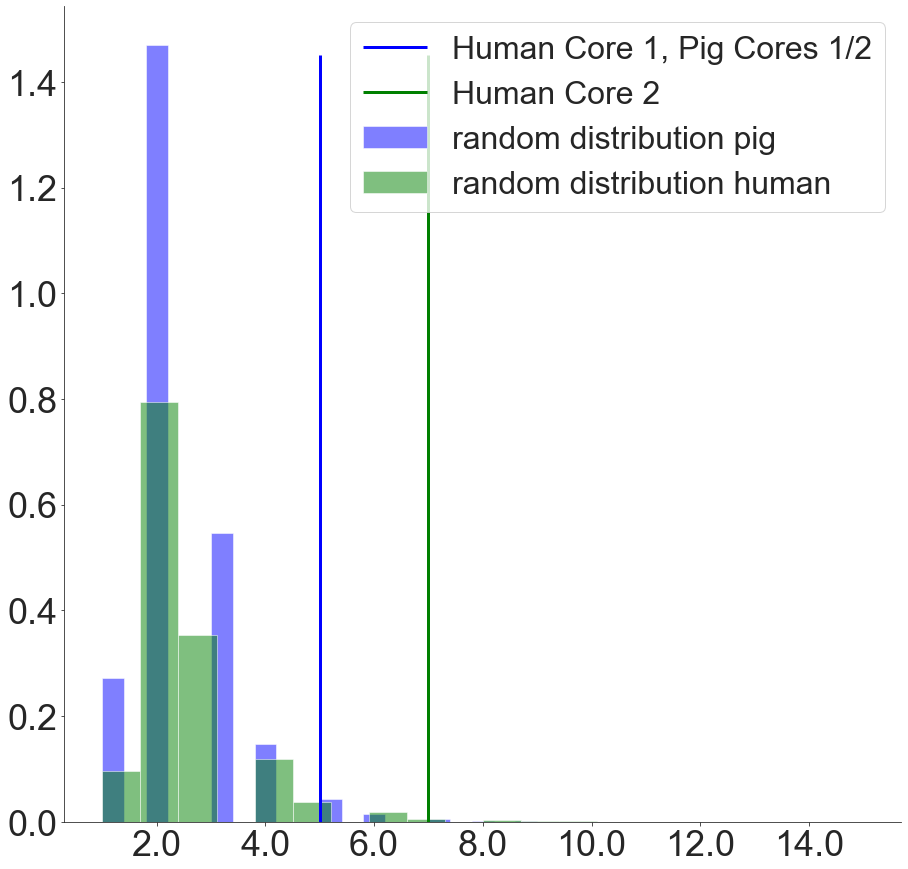

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns
# plot distributions for non-sampled case
fig, ax = plt.subplots(figsize=(15, 15))
sns.set_style('white')
sns.set_style("ticks", {"xtick.major.size": 15, "ytick.major.size": 15})

plt.vlines(5,ymin=0,ymax=1.45,color='b',linewidth=3,label='Human Core 1, Pig Cores 1/2')
plt.vlines(7,ymin=0,ymax=1.45,color='g',linewidth=3,label='Human Core 2')

plt.hist(pig_up_l_random_lccs, 20, density = True, 
         histtype ='bar',
         color = 'b',alpha=.5,
         label = 'random distribution pig')

plt.hist(human_up_l_random_lccs, 20, density = True, 
         histtype ='bar',
         color = 'g',alpha=.5,
         label = 'random distribution human')

#sns.kdeplot(pig_up_l_random_lccs,color='b',lw=.5,alpha=.5,shade=True,label='random distribution pig')
#sns.kdeplot(human_up_l_random_lccs,color='g',lw=.5,alpha=.5,shade=True,label='random distribution human')
plt.legend(loc='upper right',fontsize=32)

ax.set_xlabel("",fontsize=32)
ax.set_ylabel("",fontsize=32)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)
ax.set_yticklabels([round(y,2) for y in ax.get_yticks()], size = 36)
ax.set_xticklabels(ax.get_xticks(), size = 36)
plt.savefig('Figures/Fig3A.png',format='png',dpi=300, bbox_inches = "tight")
plt.show()

<ipython-input-39-ee92e9dcb116>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([round(y,2) for y in ax.get_yticks()], size = 36)
<ipython-input-39-ee92e9dcb116>:33: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks(), size = 36)


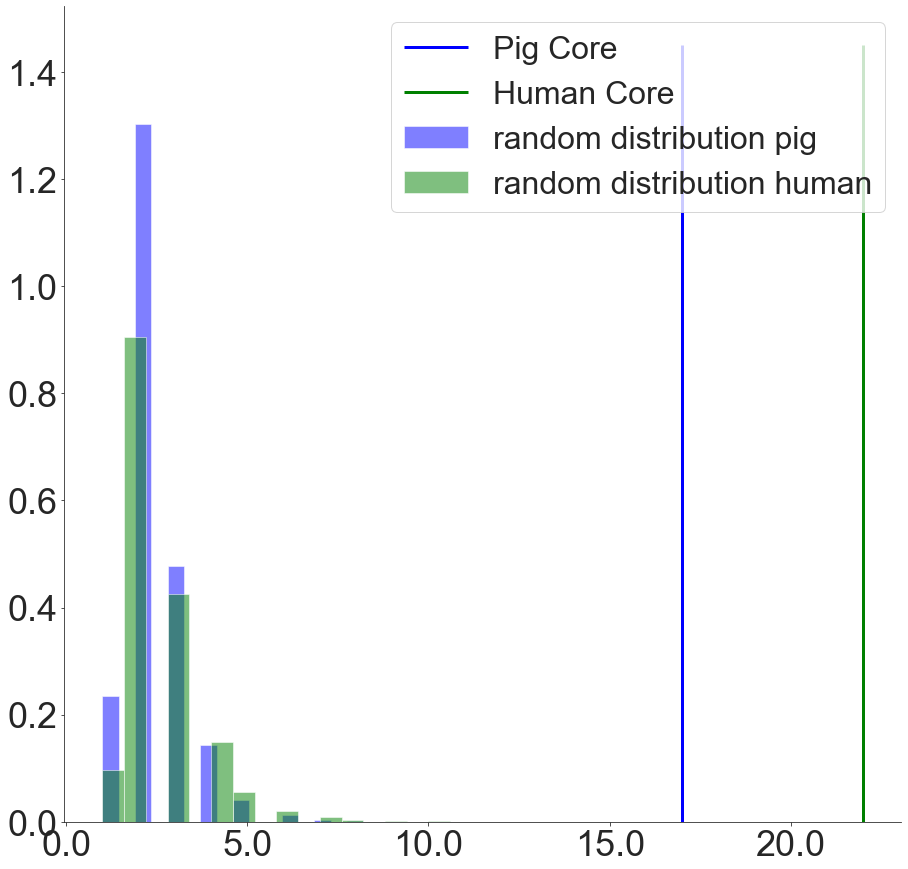

In [39]:

import matplotlib.pyplot as plt
import seaborn as sns
# plot distributions for non-sampled case
fig, ax = plt.subplots(figsize=(15, 15))
sns.set_style('white')
sns.set_style("ticks", {"xtick.major.size": 15, "ytick.major.size": 15})

plt.vlines(17,ymin=0,ymax=1.45,linewidth=3,color='b',label='Pig Core')
plt.vlines(22,ymin=0,ymax=1.45,linewidth=3,color='g',label='Human Core')

plt.hist(pig_down_l_random_lccs, 20, density = True, 
         histtype ='bar',
         color = 'b',alpha=.5,
         label = 'random distribution pig')

plt.hist(human_down_l_random_lccs, 20, density = True, 
         histtype ='bar',
         color = 'g',alpha=.5,
         label = 'random distribution human')


#sns.kdeplot(pig_down_l_random_lccs,color='b',lw=.5,alpha=.5,shade=True,label='random distribution pig')
#sns.kdeplot(human_down_l_random_lccs,color='g',lw=.5,alpha=.5,shade=True,label='random distribution human')
plt.legend(loc='upper right',fontsize=32)

ax.set_xlabel("",fontsize=32)
ax.set_ylabel("",fontsize=32)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)
ax.set_yticklabels([round(y,2) for y in ax.get_yticks()], size = 36)
ax.set_xticklabels(ax.get_xticks(), size = 36)
plt.savefig('Figures/Supp3C.png',format='png',dpi=300, bbox_inches = "tight")
plt.show()


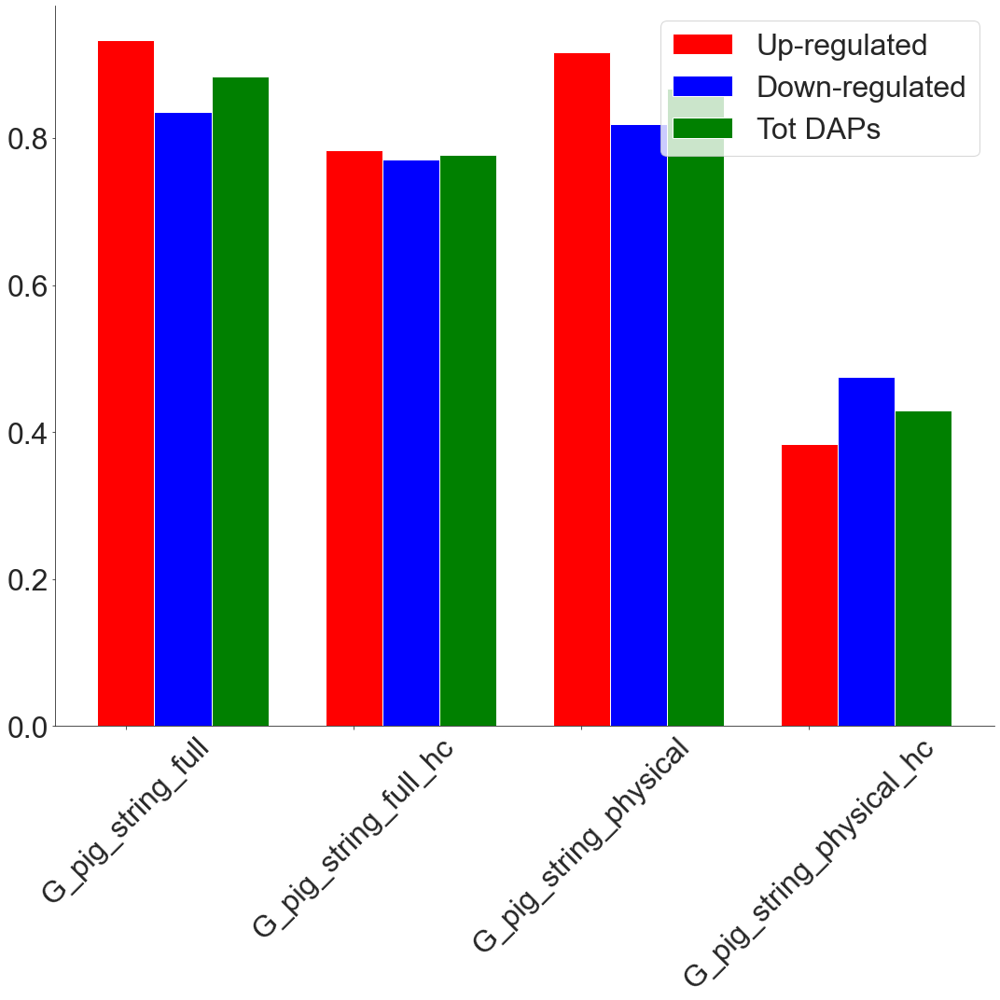

In [48]:
#Let's represent the number of proteins that we can retrieve in each network 
import numpy as np
import matplotlib.pyplot as plt
fig1, ax1 = plt.subplots(figsize=(15,15))
pig_network_list=list(networks_dict.keys())
ind = np.arange(len(networks_dict)) 
width = 0.25
  
xvals = []
for net_name in pig_network_list:
    intersected_genes=set(deg_dict['upregulated_degs'])&networks_dict[net_name].nodes()
    xvals.append(len(intersected_genes)/len(set(deg_dict['upregulated_degs'])))
bar1 = plt.bar(ind, xvals, width, color = 'r')
  
yvals = []
for net_name in pig_network_list:
    intersected_genes=set(deg_dict['downregulated_degs'])&networks_dict[net_name].nodes()
    yvals.append(len(intersected_genes)/len(set(deg_dict['downregulated_degs'])))
bar2 = plt.bar(ind+width, yvals, width, color='b')
  
zvals = []
for net_name in pig_network_list:
    intersected_genes=set(deg_dict['tot_degs'])&networks_dict[net_name].nodes()
    zvals.append(len(intersected_genes)/len(set(deg_dict['tot_degs'])))
bar3 = plt.bar(ind+width*2, zvals, width, color = 'g')
  
#plt.xlabel("Networks",fontsize=24)
#plt.ylabel('Degs percentage',fontsize=24)
plt.xlabel("",fontsize=24)
plt.ylabel('',fontsize=24)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
  
plt.xticks(ind,pig_network_list,fontsize=32,rotation=45)
plt.yticks(fontsize=32)
plt.legend( (bar1, bar2, bar3), ('Up-regulated', 'Down-regulated', 'Tot DAPs'),fontsize=32 )

plt.tight_layout()
plt.savefig('Figures/Supp3A.png',format='png',dpi=300, bbox_inches = "tight")
plt.show()

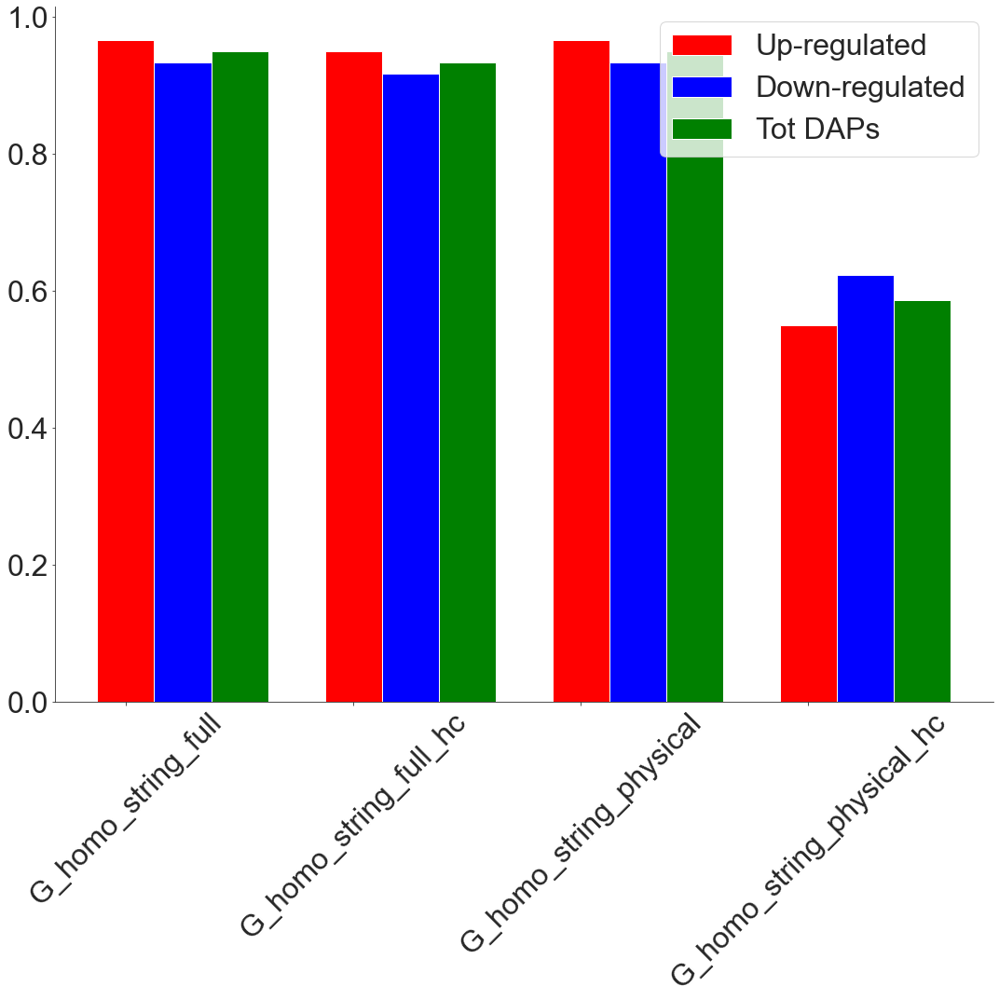

In [47]:
#Let's represent the number of proteins that we can retrieve in each network 
import numpy as np
import matplotlib.pyplot as plt
fig1, ax1 = plt.subplots(figsize=(15,15))
homo_network_list=list(homo_networks_dict.keys())
ind = np.arange(len(homo_networks_dict)) 
width = 0.25
  
xvals = []
for net_name in homo_network_list:
    intersected_genes=set(deg_dict['upregulated_degs'])&homo_networks_dict[net_name].nodes()
    xvals.append(len(intersected_genes)/len(set(deg_dict['upregulated_degs'])))
bar1 = plt.bar(ind, xvals, width, color = 'r')
  
yvals = []
for net_name in homo_network_list:
    intersected_genes=set(deg_dict['downregulated_degs'])&homo_networks_dict[net_name].nodes()
    yvals.append(len(intersected_genes)/len(set(deg_dict['downregulated_degs'])))
bar2 = plt.bar(ind+width, yvals, width, color='b')
  
zvals = []
for net_name in homo_network_list:
    intersected_genes=set(deg_dict['tot_degs'])&homo_networks_dict[net_name].nodes()
    zvals.append(len(intersected_genes)/len(set(deg_dict['tot_degs'])))
bar3 = plt.bar(ind+width*2, zvals, width, color = 'g')
  
#plt.xlabel("Networks",fontsize=24)
#plt.ylabel('Degs percentage',fontsize=24)
plt.xlabel("",fontsize=24)
plt.ylabel('',fontsize=24)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
  
plt.xticks(ind,homo_network_list,fontsize=32,rotation=45)
plt.yticks(fontsize=32)
plt.legend( (bar1, bar2, bar3), ('Up-regulated', 'Down-regulated', 'Tot DAPs'),fontsize=32 )

plt.tight_layout()
plt.savefig('Figures/Supp3B.png',format='png',dpi=300, bbox_inches = "tight")
plt.show()

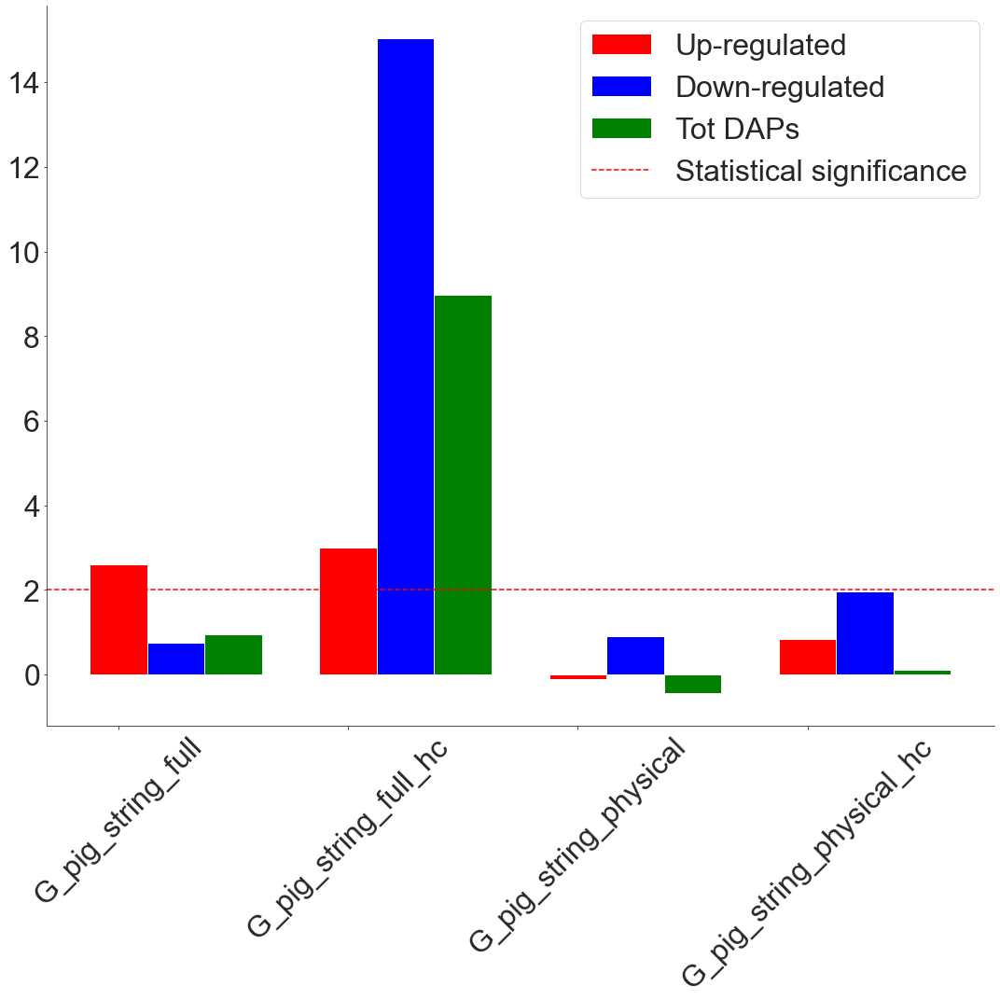

In [43]:
#Connectivity pig

#Let's represent the number of proteins that we can retrieve in each network 
import numpy as np
import matplotlib.pyplot as plt
fig1, ax1 = plt.subplots(figsize=(15,15))
pig_network_list=list(networks_dict.keys())
ind = np.arange(len(networks_dict)) 
width = 0.25
  
xvals = []
for net_name in pig_network_list:
    xvals.append(deg_modularity['upregulated_degs',net_name][0])
bar1 = plt.bar(ind, xvals, width, color = 'r')
  
yvals = []
for net_name in pig_network_list:
    yvals.append(deg_modularity['downregulated_degs',net_name][0])
bar2 = plt.bar(ind+width, yvals, width, color='b')
  
zvals = []
for net_name in pig_network_list:
    zvals.append(deg_modularity['tot_degs',net_name][0])
bar3 = plt.bar(ind+width*2, zvals, width, color = 'g')
line = plt.axhline(y = 2, color = 'r', linestyle = 'dashed')   
#plt.xlabel("Networks",fontsize=24)
#plt.ylabel('z-score',fontsize=24)
plt.xlabel("",fontsize=24)
plt.ylabel('',fontsize=24)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
  
plt.xticks(ind,pig_network_list,fontsize=32,rotation=45)
plt.yticks(fontsize=32)
plt.legend( (bar1, bar2, bar3,line), ('Up-regulated', 'Down-regulated', 'Tot DAPs', 'Statistical significance'),fontsize=32 )

plt.tight_layout()
plt.savefig('Figures/Supp3D.png',format='png',dpi=300, bbox_inches = "tight")
plt.show()

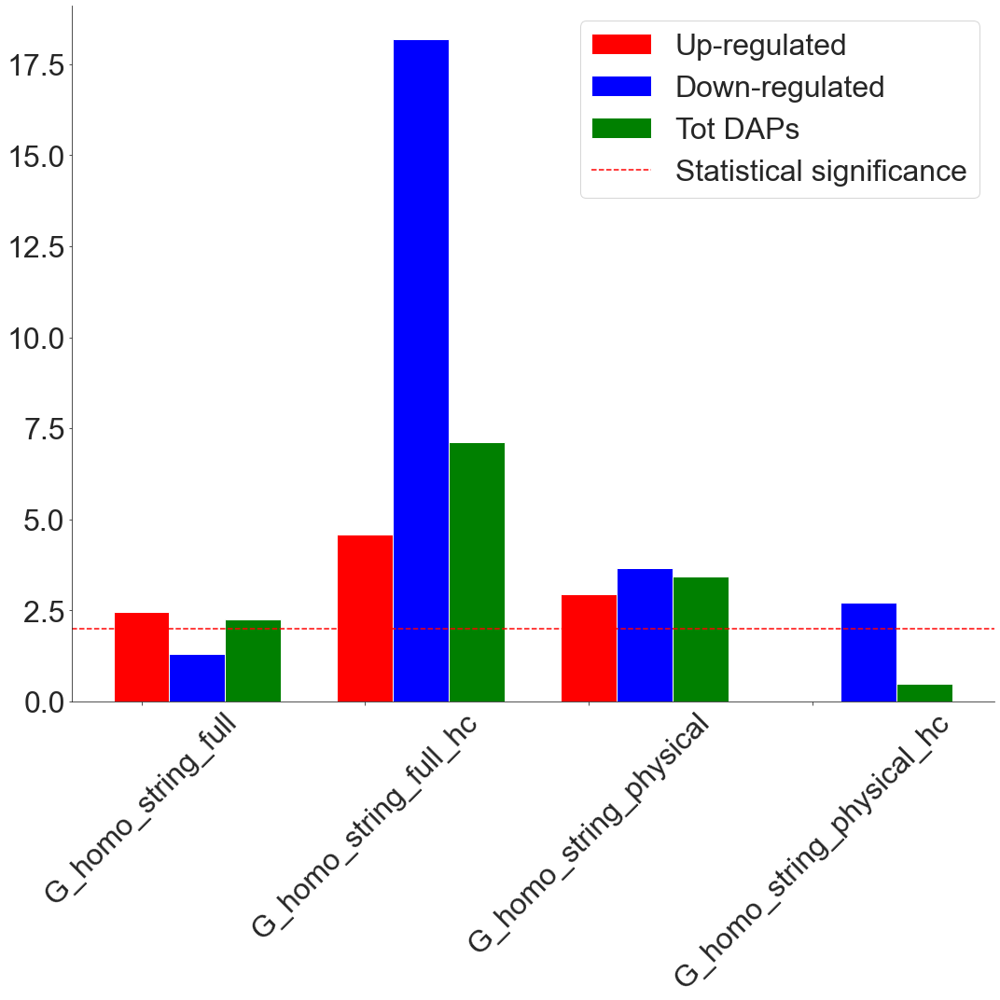

In [44]:
#Connectivity homo

import numpy as np
import matplotlib.pyplot as plt
fig1, ax1 = plt.subplots(figsize=(15,15))
homo_network_list=list(homo_networks_dict.keys())
ind = np.arange(len(homo_networks_dict)) 
width = 0.25
  
xvals = []
for net_name in homo_network_list:
    try:
        xvals.append(max(list(homo_deg_modularity['upregulated_degs',net_name].values())))
    except:
        xvals.append(0)
bar1 = plt.bar(ind, xvals, width, color = 'r')
  
yvals = []
for net_name in homo_network_list:
    try:
        yvals.append(max(list(homo_deg_modularity['downregulated_degs',net_name].values())))
    except:
        yvals.append(0)
bar2 = plt.bar(ind+width, yvals, width, color='b')
  
zvals = []
for net_name in homo_network_list:
    try:
        zvals.append(max(list(homo_deg_modularity['tot_degs',net_name].values())))
    except:
        zvals(0)
bar3 = plt.bar(ind+width*2, zvals, width, color = 'g')
plt.axhline(y = 2, color = 'r', linestyle = 'dashed')   
#plt.xlabel("Networks",fontsize=24)
#plt.ylabel('z-score',fontsize=24)
plt.xlabel("",fontsize=24)
plt.ylabel('',fontsize=24)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
  
plt.xticks(ind,homo_network_list,fontsize=32,rotation=45)
plt.yticks(fontsize=32)
plt.legend( (bar1, bar2, bar3,line), ('Up-regulated', 'Down-regulated', 'Tot DAPs', 'Statistical significance'),fontsize=32 )

plt.tight_layout()
plt.savefig('Figures/Supp3E.png',format='png',dpi=300, bbox_inches = "tight")
plt.show()

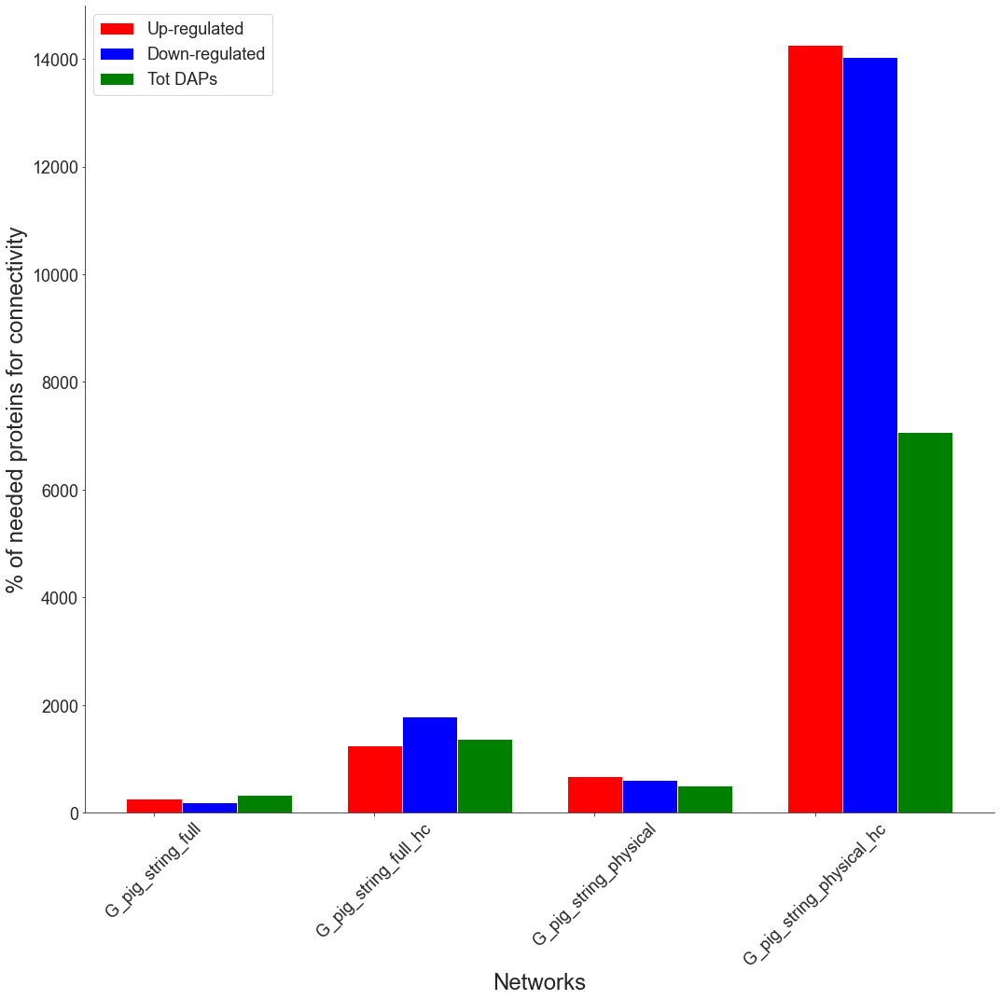

In [45]:
#Can we expand those degs to obtain a module that would connect all of them?

#Expnaded connectivity pig

import numpy as np
import matplotlib.pyplot as plt
fig1, ax1 = plt.subplots(figsize=(15,15))
network_list=list(networks_dict.keys())
ind = np.arange(len(networks_dict)) 
width = 0.25
  
xvals = [154*100/len(deg_dict['upregulated_degs']),749*100/len(deg_dict['upregulated_degs']),411*100/len(deg_dict['upregulated_degs']),8561*100/len(deg_dict['upregulated_degs'])]
bar1 = plt.bar(ind, xvals, width, color = 'r')
  
yvals = [116*100/len(deg_dict['downregulated_degs']),1090*100/len(deg_dict['downregulated_degs']),374*100/len(deg_dict['downregulated_degs']),8561*100/len(deg_dict['downregulated_degs'])]
bar2 = plt.bar(ind+width, yvals, width, color='b')
  
zvals = [404*100/len(deg_dict['tot_degs']),1668*100/len(deg_dict['tot_degs']),604*100/len(deg_dict['tot_degs']),8561*100/len(deg_dict['tot_degs'])]
bar3 = plt.bar(ind+width*2, zvals, width, color = 'g')
   
plt.xlabel("Networks",fontsize=24)
plt.ylabel('% of needed proteins for connectivity',fontsize=24)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
  
plt.xticks(ind,network_list,fontsize=18,rotation=45)
plt.yticks(fontsize=18)
plt.legend( (bar1, bar2, bar3), ('Up-regulated', 'Down-regulated', 'Tot DAPs'),fontsize=18 )

plt.tight_layout()
plt.show()

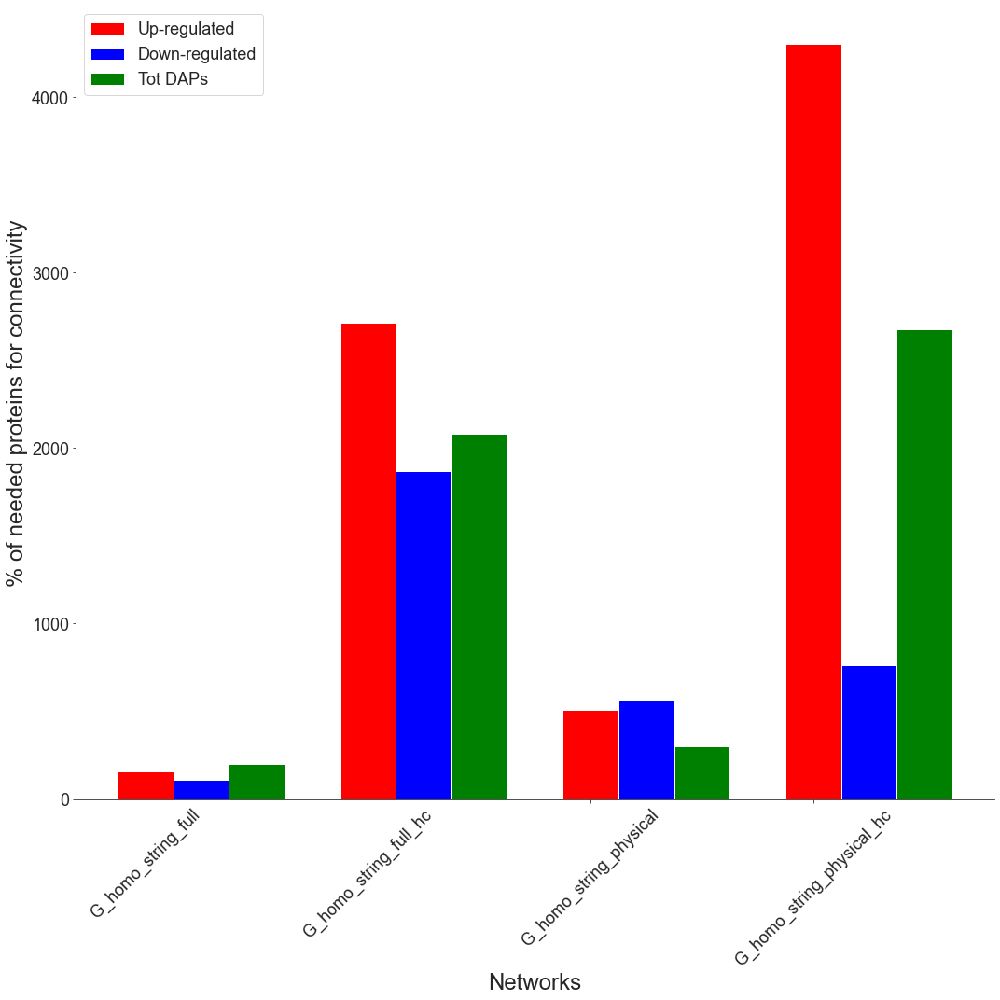

In [46]:
#Can we expand those degs to obtain a module that would connect all of them?

#Expnaded connectivity homo

import numpy as np
import matplotlib.pyplot as plt
fig1, ax1 = plt.subplots(figsize=(15,15))
homo_network_list=list(homo_networks_dict.keys())
ind = np.arange(len(homo_networks_dict)) 
width = 0.25
  
xvals = [95*100/len(deg_dict['upregulated_degs']),1629*100/len(deg_dict['upregulated_degs']),306*100/len(deg_dict['upregulated_degs']),2582*100/len(deg_dict['upregulated_degs'])]
bar1 = plt.bar(ind, xvals, width, color = 'r')
  
yvals = [66*100/len(deg_dict['downregulated_degs']),1139*100/len(deg_dict['downregulated_degs']),341*100/len(deg_dict['downregulated_degs']),467*100/len(deg_dict['downregulated_degs'])]
bar2 = plt.bar(ind+width, yvals, width, color='b')
  
zvals = [239*100/len(deg_dict['tot_degs']),2517*100/len(deg_dict['tot_degs']),367*100/len(deg_dict['tot_degs']),3240*100/len(deg_dict['tot_degs'])]
bar3 = plt.bar(ind+width*2, zvals, width, color = 'g')
   
plt.xlabel("Networks",fontsize=24)
plt.ylabel('% of needed proteins for connectivity',fontsize=24)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
  
plt.xticks(ind,homo_network_list,fontsize=18,rotation=45)
plt.yticks(fontsize=18)
plt.legend( (bar1, bar2, bar3), ('Up-regulated', 'Down-regulated', 'Tot DAPs'),fontsize=18 )

plt.tight_layout()
plt.show()